In [ ]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

In [ ]:
import os
os.environ["CUDA_LAUNCH_BLOCKING"] = "1"

In [ ]:
# s5mars_segmentation_train.py
import os, json, random, time
from pathlib import Path
from glob import glob
import numpy as np
import cv2
from tqdm import tqdm
import matplotlib.pyplot as plt

import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from torchvision.models.segmentation import deeplabv3_resnet50
from torchvision.models.segmentation.deeplabv3 import DeepLabHead

torch.backends.cudnn.benchmark = False
torch.backends.cudnn.deterministic = True

# ----------------- USER PATHS (edit these) -----------------
ROOT = r"/kaggle/input/s5marsdataset/S5Mars_data"  # dataset root
IMG_ROOT = os.path.join(ROOT, "images")   # contains easy/, hard/ etc.
MASK_ROOT = os.path.join(ROOT, "labels")  # contains easy/, hard/ etc.
TRAIN_JSON = os.path.join(ROOT, "train.json")
VAL_JSON   = os.path.join(ROOT, "val.json")   # optional
TEST_JSON  = os.path.join(ROOT, "test.json")  # optional
# ----------------------------------------------------------

NUM_CLASSES = 9
IGNORE_INDEX = 255

DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Device:", DEVICE)


# simple color palette for visualization (RGB)
PALETTE = [
    (135,206,235), # 0 sky
    (160,82,45),   # 1 ridge
    (205,133,63),  # 2 soil
    (244,164,96),  # 3 sand
    (128,128,128), # 4 bedrock
    (139,69,19),   # 5 rock
    (255,255,255), # 6 rover
    (255,215,0),   # 7 trace
    (0,0,0)        # 8 hole
]

# ----------------- Dataset -----------------
# ----------------- Dataset -----------------
class S5MarsSegDataset(Dataset):
    def __init__(self,
                 img_root,
                 mask_root,
                 samples_list=None,   # list of "easy/xxxxx" names (without ext) OR None
                 crop_size=(512,512),
                 augment=True):
        self.img_root = img_root
        self.mask_root = mask_root
        self.crop_h, self.crop_w = crop_size
        self.augment = augment

        if samples_list is None:
            # fallback: scan img_root recursively and build sample list relative to img_root
            samples = []
            for ext in ("*.png","*.jpg","*.jpeg","*.tif"):
                for p in Path(img_root).rglob(ext):
                    rel = str(p.relative_to(img_root)).replace("\\","/")  # e.g. easy/0303MR...
                    samples.append(os.path.splitext(rel)[0])
            samples.sort()
            self.samples = samples
        else:
            self.samples = samples_list

    def __len__(self):
        return len(self.samples)

    def random_crop(self, img, mask):
        h, w = img.shape[:2]
        if h <= self.crop_h or w <= self.crop_w:
            # pad then crop
            pad_h = max(0, self.crop_h - h)
            pad_w = max(0, self.crop_w - w)
            img = cv2.copyMakeBorder(img, 0, pad_h, 0, pad_w, cv2.BORDER_REFLECT)
            mask = cv2.copyMakeBorder(mask, 0, pad_h, 0, pad_w, cv2.BORDER_CONSTANT, value=IGNORE_INDEX)
            h, w = img.shape[:2]
        x = random.randint(0, w - self.crop_w)
        y = random.randint(0, h - self.crop_h)
        img_c = img[y:y+self.crop_h, x:x+self.crop_w]
        mask_c = mask[y:y+self.crop_h, x:x+self.crop_w]
        return img_c, mask_c

    def __getitem__(self, idx):
        sample = self.samples[idx]  # e.g. "easy/0303MR0012610240203842E01_DXXX"
        img_path = os.path.join(self.img_root, sample + ".png")
        mask_path = os.path.join(self.mask_root, sample + ".png")

        # fallback to jpg if png not found
        if not os.path.exists(img_path):
            alt = os.path.join(self.img_root, sample + ".jpg")
            if os.path.exists(alt):
                img_path = alt

        if not os.path.exists(mask_path):
            alt = os.path.join(self.mask_root, sample + ".png")  # adjust if masks are elsewhere

        # --- Read image and mask ---
        img = cv2.imread(img_path)
        mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)

        if img is None or mask is None:
            raise FileNotFoundError(f"Missing image or mask: {img_path} / {mask_path}")

        # --- Map invalid mask labels to IGNORE_INDEX ---
        mask = np.where((mask < 0) | (mask > 8), IGNORE_INDEX, mask)  # valid classes: 0-8
        mask = mask.astype(np.int64)

        # --- Convert BGR to RGB ---
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        # --- Random horizontal flip ---
        if self.augment and random.random() < 0.5:
            img = np.fliplr(img).copy()
            mask = np.fliplr(mask).copy()

        # --- Random crop or resize ---
        if self.augment:
            img, mask = self.random_crop(img, mask)
        else:
            img = cv2.resize(img, (self.crop_w, self.crop_h), interpolation=cv2.INTER_LINEAR)
            mask = cv2.resize(mask, (self.crop_w, self.crop_h), interpolation=cv2.INTER_NEAREST)

        # --- Normalize image (ImageNet stats) ---
        img = img.astype(np.float32) / 255.0
        mean = np.array([0.485, 0.456, 0.406], dtype=np.float32)
        std = np.array([0.229, 0.224, 0.225], dtype=np.float32)
        img = (img - mean) / std

        # --- Transpose to C,H,W ---
        img = img.transpose(2, 0, 1).astype(np.float32)
        mask = mask.astype(np.int64)

        return torch.from_numpy(img), torch.from_numpy(mask)

   

# ----------------- Metrics -----------------
def fast_confusion_matrix(preds, target, num_classes, ignore_index=255):
    """
    preds, target: numpy 1D arrays
    returns counts for confusion matrix
    """
    mask = target != ignore_index
    preds = preds[mask]
    target = target[mask]
    if len(target) == 0:
        return np.zeros((num_classes, num_classes), dtype=np.int64)
    k = (target * num_classes + preds).astype('int64')
    binc = np.bincount(k, minlength=num_classes*num_classes)
    conf = binc.reshape((num_classes, num_classes))
    return conf

def compute_miou_from_conf(conf):
    # conf: num_classes x num_classes (row=true, col=pred)
    intersection = np.diag(conf).astype(np.float64)
    union = conf.sum(axis=1) + conf.sum(axis=0) - np.diag(conf)
    valid = union > 0
    ious = np.zeros_like(intersection)
    ious[valid] = intersection[valid] / union[valid]
    mean_iou = ious[valid].mean() if valid.sum() > 0 else 0.0
    return mean_iou, ious

# ----------------- Model -----------------
def make_model(num_classes):
    # aux_loss=True avoids ValueError in new PyTorch
    model = deeplabv3_resnet50(weights="DEFAULT", aux_loss=True)
    model.classifier = DeepLabHead(2048, num_classes)
    return model


# ----------------- Training / Validation functions -----------------
def train_one_epoch(model, loader, opt, criterion, device, scaler=None):
    model.train()
    running_loss = 0.0
    conf = np.zeros((NUM_CLASSES, NUM_CLASSES), dtype=np.int64)
    for imgs, masks in tqdm(loader, desc="train", leave=False):
        imgs = imgs.to(device, dtype=torch.float32)
        masks = masks.to(device, dtype=torch.long)

        opt.zero_grad()
        with torch.cuda.amp.autocast(enabled=(scaler is not None)):
            out = model(imgs)['out']  # (B, C, H, W)
            loss = criterion(out, masks)
        if scaler is not None:
            scaler.scale(loss).backward()
            scaler.step(opt)
            scaler.update()
        else:
            loss.backward()
            opt.step()

        running_loss += float(loss.item()) * imgs.size(0)
        preds = out.argmax(dim=1).cpu().numpy().ravel()
        tgts  = masks.cpu().numpy().ravel()
        conf += fast_confusion_matrix(preds, tgts, NUM_CLASSES, IGNORE_INDEX)
    N = len(loader.dataset)
    epoch_loss = running_loss / N
    miou, _ = compute_miou_from_conf(conf)
    return epoch_loss, miou

def validate(model, loader, criterion, device):
    model.eval()
    running_loss = 0.0
    conf = np.zeros((NUM_CLASSES, NUM_CLASSES), dtype=np.int64)
    with torch.no_grad():
        for imgs, masks in tqdm(loader, desc="val", leave=False):
            imgs = imgs.to(device, dtype=torch.float32)
            masks = masks.to(device, dtype=torch.long)
            out = model(imgs)['out']
            loss = criterion(out, masks)

            running_loss += float(loss.item()) * imgs.size(0)
            preds = out.argmax(dim=1).cpu().numpy().ravel()
            tgts  = masks.cpu().numpy().ravel()
            conf += fast_confusion_matrix(preds, tgts, NUM_CLASSES, IGNORE_INDEX)
    N = len(loader.dataset)
    epoch_loss = running_loss / N
    miou, ious = compute_miou_from_conf(conf)
    return epoch_loss, miou, ious

# ----------------- Main -----------------
def main():
    # ----------------- Load JSON lists -----------------
    train_list = None
    val_list = None
    if os.path.exists(TRAIN_JSON):
        with open(TRAIN_JSON, 'r') as f:
            train_list = json.load(f)
    if os.path.exists(VAL_JSON):
        with open(VAL_JSON, 'r') as f:
            val_list = json.load(f)

    # ----------------- Create datasets -----------------
    train_ds = S5MarsSegDataset(IMG_ROOT, MASK_ROOT, samples_list=train_list, crop_size=(384,384), augment=True)
    val_ds   = S5MarsSegDataset(IMG_ROOT, MASK_ROOT, samples_list=val_list, crop_size=(384,384), augment=False)

    print("Train samples:", len(train_ds), "Val samples:", len(val_ds))

    # ----------------- Create dataloaders -----------------
    train_loader = DataLoader(train_ds, batch_size=4, shuffle=True, num_workers=0, pin_memory=True)
    val_loader   = DataLoader(val_ds, batch_size=4, shuffle=False, num_workers=0, pin_memory=True)


    for imgs, masks in train_loader:
       print("Mask min:", masks.min().item(), "Mask max:", masks.max().item())
       break



    # ----------------- Create model -----------------
    model = make_model(NUM_CLASSES).to(DEVICE)
    if torch.cuda.device_count() > 1:
        print(f"Using {torch.cuda.device_count()} GPUs")
        model = nn.DataParallel(model)  # wrap for multi-GPU

    # ----------------- Optimizer & loss -----------------
    optimizer = torch.optim.AdamW(model.parameters(), lr=1e-4, weight_decay=1e-4)
    criterion = nn.CrossEntropyLoss(ignore_index=IGNORE_INDEX)

    # ----------------- Training loop -----------------
    best_miou = 0.0
    epochs = 30
    for epoch in range(1, epochs+1):
        t0 = time.time()

        # train (FP32)
        train_loss, train_miou = train_one_epoch(model, train_loader, optimizer, criterion, DEVICE, scaler=None)
        val_loss, val_miou, val_ious = validate(model, val_loader, criterion, DEVICE)
        dt = time.time() - t0

        print(f"Epoch {epoch}/{epochs}  time={dt:.0f}s  train_loss={train_loss:.4f} train_mIoU={train_miou:.4f}  val_loss={val_loss:.4f} val_mIoU={val_miou:.4f}")

        # ----------------- Checkpoint -----------------
        ckpt = {
            "epoch": epoch,
            "model_state": model.state_dict(),
            "optimizer_state": optimizer.state_dict(),
            "best_miou": best_miou,
        }
        torch.save(ckpt, f"checkpoint_epoch_{epoch}.pth")

        if val_miou > best_miou:
            best_miou = val_miou
            torch.save(ckpt, "best_s5mars_checkpoint.pth")
            print("Saved best checkpoint.")

    print("Training done. Best mIoU:", best_miou)


if __name__ == "__main__":
    main()


In [ ]:
# s5mars_segmentation_train.py
import os, json, random, time
from pathlib import Path
import numpy as np
import cv2
from tqdm import tqdm

import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
from torchvision.models.segmentation import deeplabv3_resnet50
from torchvision.models.segmentation.deeplabv3 import DeepLabHead

# ----------------- USER PATHS (edit these) -----------------
ROOT = r"/kaggle/input/s5marsdataset/S5Mars_data"  # dataset root
IMG_ROOT = os.path.join(ROOT, "images")   # contains easy/, hard/ etc.
MASK_ROOT = os.path.join(ROOT, "labels")  # contains easy/, hard/ etc.
TRAIN_JSON = os.path.join(ROOT, "train.json")
VAL_JSON   = os.path.join(ROOT, "val.json")   # optional

NUM_CLASSES = 9
IGNORE_INDEX = 255

DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Device:", DEVICE)

# ----------------- Dataset -----------------
class S5MarsSegDataset(Dataset):
    def __init__(self, img_root, mask_root, samples_list=None, crop_size=(512,512), augment=True):
        self.img_root = img_root
        self.mask_root = mask_root
        self.crop_h, self.crop_w = crop_size
        self.augment = augment

        if samples_list is None:
            # scan img_root recursively
            samples = []
            for ext in ("*.png","*.jpg","*.jpeg","*.tif"):
                for p in Path(img_root).rglob(ext):
                    rel = str(p.relative_to(img_root)).replace("\\","/")
                    samples.append(os.path.splitext(rel)[0])
            samples.sort()
            self.samples = samples
        else:
            self.samples = samples_list

    def __len__(self):
        return len(self.samples)

    def random_crop(self, img, mask):
        h, w = img.shape[:2]
        if h <= self.crop_h or w <= self.crop_w:
            pad_h = max(0, self.crop_h - h)
            pad_w = max(0, self.crop_w - w)
            img = cv2.copyMakeBorder(img, 0, pad_h, 0, pad_w, cv2.BORDER_REFLECT)
            mask = cv2.copyMakeBorder(mask, 0, pad_h, 0, pad_w, cv2.BORDER_CONSTANT, value=IGNORE_INDEX)
            h, w = img.shape[:2]
        x = random.randint(0, w - self.crop_w)
        y = random.randint(0, h - self.crop_h)
        return img[y:y+self.crop_h, x:x+self.crop_w], mask[y:y+self.crop_h, x:x+self.crop_w]

    def __getitem__(self, idx):
     sample = self.samples[idx]
     img_path = os.path.join(self.img_root, sample + ".png")
     mask_path = os.path.join(self.mask_root, sample + ".png")

    # fallback to jpg if png not found
     if not os.path.exists(img_path):
         alt = os.path.join(self.img_root, sample + ".jpg")
         if os.path.exists(alt):
            img_path = alt

     img = cv2.imread(img_path)
     mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)

     if img is None or mask is None:
         raise FileNotFoundError(f"Missing image or mask: {img_path} / {mask_path}")

    # --- Convert BGR to RGB ---
     img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # --- Random horizontal flip ---
     if self.augment and random.random() < 0.5:
         img = np.fliplr(img).copy()
         mask = np.fliplr(mask).copy()

    # --- Random crop or resize ---
     if self.augment:
         img, mask = self.random_crop(img, mask)
     else:
         img = cv2.resize(img, (self.crop_w, self.crop_h), interpolation=cv2.INTER_LINEAR)
         mask = cv2.resize(mask, (self.crop_w, self.crop_h), interpolation=cv2.INTER_NEAREST)

    # --- Clip invalid mask values to IGNORE_INDEX ---
     mask = np.where((mask < 0) | (mask >= NUM_CLASSES), IGNORE_INDEX, mask).astype(np.int64)

    # --- Normalize image ---
     img = img.astype(np.float32) / 255.0
     mean = np.array([0.485, 0.456, 0.406], dtype=np.float32)
     std = np.array([0.229, 0.224, 0.225], dtype=np.float32)
     img = (img - mean) / std

    # --- Transpose to C,H,W ---
     img = img.transpose(2,0,1).astype(np.float32)

     return torch.from_numpy(img), torch.from_numpy(mask).long()


# ----------------- Metrics -----------------
def fast_confusion_matrix(preds, target, num_classes, ignore_index=255):
    mask = target != ignore_index
    preds = preds[mask]
    target = target[mask]
    if len(target) == 0:
        return np.zeros((num_classes, num_classes), dtype=np.int64)
    k = (target * num_classes + preds).astype('int64')
    binc = np.bincount(k, minlength=num_classes*num_classes)
    return binc.reshape((num_classes, num_classes))

def compute_miou_from_conf(conf):
    intersection = np.diag(conf).astype(np.float64)
    union = conf.sum(axis=1) + conf.sum(axis=0) - np.diag(conf)
    valid = union > 0
    ious = np.zeros_like(intersection)
    ious[valid] = intersection[valid] / union[valid]
    mean_iou = ious[valid].mean() if valid.sum() > 0 else 0.0
    return mean_iou, ious

# ----------------- Model -----------------
def make_model(num_classes):
    model = deeplabv3_resnet50(weights="DEFAULT", aux_loss=True)
    model.classifier = DeepLabHead(2048, num_classes)
    return model

# ----------------- Training / Validation -----------------
def train_one_epoch(model, loader, opt, criterion, device, scaler=None):
    model.train()
    running_loss = 0.0
    conf = np.zeros((NUM_CLASSES, NUM_CLASSES), dtype=np.int64)
    for imgs, masks in tqdm(loader, desc="train", leave=False):
        imgs = imgs.to(device, dtype=torch.float32)
        masks = masks.to(device, dtype=torch.long)

        opt.zero_grad()
        with torch.cuda.amp.autocast(enabled=(scaler is not None)):
            out = model(imgs)['out']
            loss = criterion(out, masks)
        if scaler is not None:
            scaler.scale(loss).backward()
            scaler.step(opt)
            scaler.update()
        else:
            loss.backward()
            opt.step()

        running_loss += float(loss.item()) * imgs.size(0)
        preds = out.argmax(dim=1).cpu().numpy().ravel()
        tgts  = masks.cpu().numpy().ravel()
        conf += fast_confusion_matrix(preds, tgts, NUM_CLASSES, IGNORE_INDEX)

    epoch_loss = running_loss / len(loader.dataset)
    miou, _ = compute_miou_from_conf(conf)
    return epoch_loss, miou

def validate(model, loader, criterion, device):
    model.eval()
    running_loss = 0.0
    conf = np.zeros((NUM_CLASSES, NUM_CLASSES), dtype=np.int64)
    with torch.no_grad():
        for imgs, masks in tqdm(loader, desc="val", leave=False):
            imgs = imgs.to(device, dtype=torch.float32)
            masks = masks.to(device, dtype=torch.long)
            out = model(imgs)['out']
            loss = criterion(out, masks)

            running_loss += float(loss.item()) * imgs.size(0)
            preds = out.argmax(dim=1).cpu().numpy().ravel()
            tgts  = masks.cpu().numpy().ravel()
            conf += fast_confusion_matrix(preds, tgts, NUM_CLASSES, IGNORE_INDEX)

    epoch_loss = running_loss / len(loader.dataset)
    miou, ious = compute_miou_from_conf(conf)
    return epoch_loss, miou, ious

# ----------------- Main -----------------
def main():
    # Load JSON lists
    train_list, val_list = None, None
    if os.path.exists(TRAIN_JSON):
        with open(TRAIN_JSON, 'r') as f:
            train_list = json.load(f)
    if os.path.exists(VAL_JSON):
        with open(VAL_JSON, 'r') as f:
            val_list = json.load(f)

    # Create datasets and loaders
    train_ds = S5MarsSegDataset(IMG_ROOT, MASK_ROOT, samples_list=train_list, crop_size=(384,384), augment=True)
    val_ds   = S5MarsSegDataset(IMG_ROOT, MASK_ROOT, samples_list=val_list, crop_size=(384,384), augment=False)

    print("Train samples:", len(train_ds), "Val samples:", len(val_ds))

    train_loader = DataLoader(train_ds, batch_size=4, shuffle=True, num_workers=4, pin_memory=True)
    val_loader   = DataLoader(val_ds, batch_size=4, shuffle=False, num_workers=2, pin_memory=True)

    # Debug first batch masks
    for imgs, masks in train_loader:
        print("Mask min:", masks.min().item(), "Mask max:", masks.max().item())
        break

    # Create model
    model = make_model(NUM_CLASSES).to(DEVICE)
    if torch.cuda.device_count() > 1:
        model = nn.DataParallel(model)

    optimizer = torch.optim.AdamW(model.parameters(), lr=1e-4, weight_decay=1e-4)
    criterion = nn.CrossEntropyLoss(ignore_index=IGNORE_INDEX)

    # Training loop
    best_miou = 0.0
    epochs = 30
    for epoch in range(1, epochs+1):
        t0 = time.time()
        train_loss, train_miou = train_one_epoch(model, train_loader, optimizer, criterion, DEVICE)
        val_loss, val_miou, val_ious = validate(model, val_loader, criterion, DEVICE)
        dt = time.time() - t0

        print(f"Epoch {epoch}/{epochs}  time={dt:.0f}s  train_loss={train_loss:.4f} train_mIoU={train_miou:.4f}  val_loss={val_loss:.4f} val_mIoU={val_miou:.4f}")

        # Save checkpoints
        ckpt = {
            "epoch": epoch,
            "model_state": model.state_dict(),
            "optimizer_state": optimizer.state_dict(),
            "best_miou": best_miou,
        }
        torch.save(ckpt, f"checkpoint_epoch_{epoch}.pth")
        if val_miou > best_miou:
            best_miou = val_miou
            torch.save(ckpt, "best_s5mars_checkpoint.pth")
            print("Saved best checkpoint.")

    print("Training done. Best mIoU:", best_miou)


if __name__ == "__main__":
    main()


In [ ]:
pip install segmentation-models-pytorch==0.3.3 albumentations==1.4.0


In [ ]:
import os, json, cv2, torch, numpy as np
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
import albumentations as A
from albumentations.pytorch import ToTensorV2
import segmentation_models_pytorch as smp
from tqdm import tqdm
import matplotlib.pyplot as plt

# ================================
# ⚙️ CONFIG
# ================================
DATA_ROOT = r"/kaggle/input/s5marsdataset/S5Mars_data"  # Change if local
IMG_DIR = os.path.join(DATA_ROOT, "images")
MASK_DIR = os.path.join(DATA_ROOT, "labels")
SPLIT_DIR = os.path.join(DATA_ROOT, "split")
IMG_SIZE = 256
NUM_CLASSES = 9
BATCH_SIZE = 8
EPOCHS = 40
LR = 1e-4
CHECKPOINT_PATH = "checkpoint.pth"
BEST_MODEL_PATH = "best_model.pth"
LAST_MODEL_PATH = "last_model.pth"

DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
print(f"Running on: {DEVICE}")

# Enable mixed precision
scaler = torch.amp.GradScaler(enabled=(DEVICE=="cuda"))

# ================================
# 🧩 LOAD SPLIT FILES
# ================================
def read_split(path):
    with open(path, "r") as f:
        data = json.load(f)
    return data  # JSON is already a list

train_files = read_split(os.path.join(SPLIT_DIR, "train.json"))
val_files   = read_split(os.path.join(SPLIT_DIR, "val.json"))

# ================================
# 🧠 DATASET
# ================================
class MarsDataset(Dataset):
    def __init__(self, files, img_dir, mask_dir, augment=False):
        self.files = files
        self.img_dir = img_dir
        self.mask_dir = mask_dir
        self.transform = A.Compose(
            [
                A.Resize(IMG_SIZE, IMG_SIZE),
                A.HorizontalFlip(p=0.5),
                A.VerticalFlip(p=0.2),
                A.RandomRotate90(p=0.3),
                A.ColorJitter(0.2, 0.2, 0.2, 0.1, p=0.4),
                ToTensorV2()  # no dtype argument
            ]
        ) if augment else A.Compose(
            [
                A.Resize(IMG_SIZE, IMG_SIZE),
                ToTensorV2()  # no dtype argument
            ]
        )

    def __len__(self):
        return len(self.files)

    def __getitem__(self, idx):
        fname = self.files[idx]  # e.g., "easy/0387MR0015870020301904E01_DXXX"
        
        # Add correct extensions
        img_path = os.path.join(self.img_dir, fname + ".jpg")
        mask_path = os.path.join(self.mask_dir, fname + ".png")

        if not os.path.exists(img_path):
            raise FileNotFoundError(f"Image not found: {img_path}")
        if not os.path.exists(mask_path):
            raise FileNotFoundError(f"Mask not found: {mask_path}")

        img = cv2.imread(img_path)
        mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
        mask[mask == 255] = 0

        aug = self.transform(image=cv2.cvtColor(img, cv2.COLOR_BGR2RGB), mask=mask)
        image = aug["image"].float()   # convert to float32 for mixed precision
        mask = aug["mask"].long()
        return image, mask

# ================================
# 🔄 DATALOADERS
# ================================
train_ds = MarsDataset(train_files, IMG_DIR, MASK_DIR, augment=True)
val_ds   = MarsDataset(val_files, IMG_DIR, MASK_DIR, augment=False)
train_loader = DataLoader(train_ds, batch_size=BATCH_SIZE, shuffle=True, num_workers=2)
val_loader   = DataLoader(val_ds, batch_size=BATCH_SIZE, shuffle=False, num_workers=2)

# ================================
# 🧮 MODEL
# ================================
model = smp.Unet(
    encoder_name="efficientnet-b0",
    encoder_weights="imagenet",
    in_channels=3,
    classes=NUM_CLASSES
).to(DEVICE)

loss_fn = smp.losses.DiceLoss(mode="multiclass")
optimizer = torch.optim.AdamW(model.parameters(), lr=LR)
scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=EPOCHS)

start_epoch = 0
best_iou = 0

# ================================
# ♻️ RESUME CHECKPOINT IF EXISTS
# ================================
if os.path.exists(CHECKPOINT_PATH):
    checkpoint = torch.load(CHECKPOINT_PATH, map_location=DEVICE)
    model.load_state_dict(checkpoint["model_state_dict"])
    optimizer.load_state_dict(checkpoint["optimizer_state_dict"])
    scheduler.load_state_dict(checkpoint["scheduler_state_dict"])
    start_epoch = checkpoint["epoch"] + 1
    best_iou = checkpoint["best_iou"]
    print(f"Resumed training from epoch {start_epoch} (Best IoU: {best_iou:.4f})")

# ================================
# 🚀 TRAINING LOOP
# ================================
for epoch in range(start_epoch, EPOCHS):
    model.train()
    total_loss = 0

    for imgs, masks in tqdm(train_loader, desc=f"Epoch {epoch+1}/{EPOCHS}"):
        imgs, masks = imgs.to(DEVICE), masks.to(DEVICE)
        optimizer.zero_grad()
        with torch.cuda.amp.autocast(enabled=(DEVICE=="cuda")):
            preds = model(imgs)
            loss = loss_fn(preds, masks)
        scaler.scale(loss).backward()
        scaler.step(optimizer)
        scaler.update()
        total_loss += loss.item()
    scheduler.step()

    # ===============================
    # 🔍 VALIDATION
    # ===============================
    model.eval()
    val_loss, val_iou, val_acc = 0, 0, 0
    with torch.no_grad():
        for imgs, masks in val_loader:
            imgs, masks = imgs.to(DEVICE), masks.to(DEVICE)
            preds = model(imgs)
            loss = loss_fn(preds, masks)
            preds_cls = torch.argmax(preds, dim=1)
            val_loss += loss.item()
            val_iou += smp.metrics.iou_score(preds_cls, masks, ignore_index=255)
            val_acc += (preds_cls == masks).float().mean()

    avg_train_loss = total_loss / len(train_loader)
    avg_val_loss = val_loss / len(val_loader)
    avg_iou = val_iou / len(val_loader)
    avg_acc = val_acc / len(val_loader)

    print(f"Epoch [{epoch+1}/{EPOCHS}] "
          f"TrainLoss: {avg_train_loss:.4f} | ValLoss: {avg_val_loss:.4f} | "
          f"IoU: {avg_iou:.4f} | Acc: {avg_acc:.4f}")

    # ===============================
    # 💾 SAVE CHECKPOINT
    # ===============================
    torch.save({
        "epoch": epoch,
        "model_state_dict": model.state_dict(),
        "optimizer_state_dict": optimizer.state_dict(),
        "scheduler_state_dict": scheduler.state_dict(),
        "best_iou": best_iou
    }, CHECKPOINT_PATH)

    # Save best model
    if avg_iou > best_iou:
        best_iou = avg_iou
        torch.save(model.state_dict(), BEST_MODEL_PATH)
        print(f"✅ Saved new best model (IoU: {best_iou:.4f})")

# ================================
# 💾 SAVE FINAL MODEL
# ================================
torch.save(model.state_dict(), LAST_MODEL_PATH)
print(f"Training complete. Final model saved as '{LAST_MODEL_PATH}'")

# ================================
# 🖼️ VISUALIZE SAMPLE OUTPUT
# ================================
imgs, masks = next(iter(val_loader))
imgs, masks = imgs.to(DEVICE), masks.to(DEVICE)
with torch.no_grad():
    preds = torch.argmax(model(imgs), dim=1).cpu().numpy()

img = imgs[0].permute(1,2,0).cpu().numpy()
plt.figure(figsize=(12,4))
plt.subplot(1,3,1); plt.imshow(img); plt.title("Input"); plt.axis("off")
plt.subplot(1,3,2); plt.imshow(masks[0].cpu(), cmap="tab10"); plt.title("True Mask"); plt.axis("off")
plt.subplot(1,3,3); plt.imshow(preds[0], cmap="tab10"); plt.title("Predicted Mask"); plt.axis("off")
plt.show()


In [ ]:
import os, json, cv2, torch, numpy as np
from torch.utils.data import Dataset, DataLoader
import albumentations as A
from albumentations.pytorch import ToTensorV2
import segmentation_models_pytorch as smp
from tqdm import tqdm
import matplotlib.pyplot as plt

# ================================
# CONFIG
# ================================
DATA_ROOT = r"/kaggle/input/s5marsdataset/S5Mars_data"
IMG_DIR = os.path.join(DATA_ROOT, "images")
MASK_DIR = os.path.join(DATA_ROOT, "labels")
SPLIT_DIR = os.path.join(DATA_ROOT, "split")
IMG_SIZE = 256
NUM_CLASSES = 9
BATCH_SIZE = 8
EPOCHS = 40
LR = 1e-4
CHECKPOINT_PATH = "checkpoint.pth"
BEST_MODEL_PATH = "best_model.pth"
LAST_MODEL_PATH = "last_model.pth"

DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
print(f"Running on: {DEVICE}")

# Disable cudnn auto-tuning to prevent stream mismatch
torch.backends.cudnn.benchmark = False
torch.backends.cudnn.deterministic = True

# Enable mixed precision
scaler = torch.amp.GradScaler(enabled=(DEVICE=="cuda"))

# ================================
# LOAD SPLIT FILES
# ================================
def read_split(path):
    with open(path, "r") as f:
        data = json.load(f)
    return data  # Already a list of filenames

train_files = read_split(os.path.join(SPLIT_DIR, "train.json"))
val_files   = read_split(os.path.join(SPLIT_DIR, "val.json"))

# ================================
# DATASET
# ================================
class MarsDataset(Dataset):
    def __init__(self, files, img_dir, mask_dir, augment=False):
        self.files = files
        self.img_dir = img_dir
        self.mask_dir = mask_dir
        self.transform = A.Compose(
            [
                A.Resize(IMG_SIZE, IMG_SIZE),
                A.HorizontalFlip(p=0.5),
                A.VerticalFlip(p=0.2),
                A.RandomRotate90(p=0.3),
                A.ColorJitter(0.2,0.2,0.2,0.1,p=0.4),
                ToTensorV2()  # Converts to float automatically
            ]
        ) if augment else A.Compose(
            [
                A.Resize(IMG_SIZE, IMG_SIZE),
                ToTensorV2()
            ]
        )

    def __len__(self):
        return len(self.files)

    def __getitem__(self, idx):
        fname = self.files[idx]  # e.g., "easy/0387MR0015870020301904E01_DXXX"
        img_path = os.path.join(self.img_dir, fname + ".jpg")
        mask_path = os.path.join(self.mask_dir, fname + ".png")

        if not os.path.exists(img_path):
            raise FileNotFoundError(f"Image not found: {img_path}")
        if not os.path.exists(mask_path):
            raise FileNotFoundError(f"Mask not found: {mask_path}")

        img = cv2.imread(img_path)
        mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
        mask[mask == 255] = 0

        aug = self.transform(image=cv2.cvtColor(img, cv2.COLOR_BGR2RGB), mask=mask)
        image = aug["image"].float()  # float32 for AMP
        mask = aug["mask"].long()
        return image, mask

# ================================
# DATALOADERS
# ================================
train_ds = MarsDataset(train_files, IMG_DIR, MASK_DIR, augment=True)
val_ds   = MarsDataset(val_files, IMG_DIR, MASK_DIR, augment=False)
train_loader = DataLoader(train_ds, batch_size=BATCH_SIZE, shuffle=True, num_workers=0)
val_loader   = DataLoader(val_ds, batch_size=BATCH_SIZE, shuffle=False, num_workers=0)

# ================================
# MODEL
# ================================
model = smp.Unet(
    encoder_name="efficientnet-b0",
    encoder_weights="imagenet",
    in_channels=3,
    classes=NUM_CLASSES
).to(DEVICE)

loss_fn = smp.losses.DiceLoss(mode="multiclass")
optimizer = torch.optim.AdamW(model.parameters(), lr=LR)
scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=EPOCHS)

start_epoch = 0
best_iou = 0

# ================================
# RESUME CHECKPOINT
# ================================
if os.path.exists(CHECKPOINT_PATH):
    checkpoint = torch.load(CHECKPOINT_PATH, map_location=DEVICE)
    model.load_state_dict(checkpoint["model_state_dict"])
    optimizer.load_state_dict(checkpoint["optimizer_state_dict"])
    scheduler.load_state_dict(checkpoint["scheduler_state_dict"])
    start_epoch = checkpoint["epoch"] + 1
    best_iou = checkpoint["best_iou"]
    print(f"Resumed training from epoch {start_epoch} (Best IoU: {best_iou:.4f})")

# ================================
# TRAIN LOOP
# ================================
for epoch in range(start_epoch, EPOCHS):
    model.train()
    total_loss = 0

    for imgs, masks in tqdm(train_loader, desc=f"Epoch {epoch+1}/{EPOCHS}"):
        imgs, masks = imgs.to(DEVICE), masks.to(DEVICE)
        optimizer.zero_grad()
        with torch.cuda.amp.autocast(enabled=(DEVICE=="cuda")):
            preds = model(imgs)
            loss = loss_fn(preds, masks)
        scaler.scale(loss).backward()
        scaler.step(optimizer)
        scaler.update()
        total_loss += loss.item()
    scheduler.step()

    # ===============================
    # VALIDATION
    # ===============================
    model.eval()
    val_loss, val_iou, val_acc = 0, 0, 0
    with torch.no_grad():
        for imgs, masks in val_loader:
            imgs, masks = imgs.to(DEVICE), masks.to(DEVICE)
            preds = model(imgs)
            loss = loss_fn(preds, masks)
            preds_cls = torch.argmax(preds, dim=1)
            val_loss += loss.item()
            val_iou += smp.metrics.iou_score(preds_cls, masks, ignore_index=255)
            val_acc += (preds_cls == masks).float().mean()

    avg_train_loss = total_loss / len(train_loader)
    avg_val_loss = val_loss / len(val_loader)
    avg_iou = val_iou / len(val_loader)
    avg_acc = val_acc / len(val_loader)

    print(f"Epoch [{epoch+1}/{EPOCHS}] "
          f"TrainLoss: {avg_train_loss:.4f} | ValLoss: {avg_val_loss:.4f} | "
          f"IoU: {avg_iou:.4f} | Acc: {avg_acc:.4f}")

    # ===============================
    # SAVE CHECKPOINT
    # ===============================
    torch.save({
        "epoch": epoch,
        "model_state_dict": model.state_dict(),
        "optimizer_state_dict": optimizer.state_dict(),
        "scheduler_state_dict": scheduler.state_dict(),
        "best_iou": best_iou
    }, CHECKPOINT_PATH)

    if avg_iou > best_iou:
        best_iou = avg_iou
        torch.save(model.state_dict(), BEST_MODEL_PATH)
        print(f"✅ Saved new best model (IoU: {best_iou:.4f})")

# ================================
# SAVE FINAL MODEL
# ================================
torch.save(model.state_dict(), LAST_MODEL_PATH)
print(f"Training complete. Final model saved as '{LAST_MODEL_PATH}'")

# ================================
# VISUALIZE SAMPLE OUTPUT
# ================================
imgs, masks = next(iter(val_loader))
imgs, masks = imgs.to(DEVICE), masks.to(DEVICE)
with torch.no_grad():
    preds = torch.argmax(model(imgs), dim=1).cpu().numpy()

img = imgs[0].permute(1,2,0).cpu().numpy()
plt.figure(figsize=(12,4))
plt.subplot(1,3,1); plt.imshow(img); plt.title("Input"); plt.axis("off")
plt.subplot(1,3,2); plt.imshow(masks[0].cpu(), cmap="tab10"); plt.title("True Mask"); plt.axis("off")
plt.subplot(1,3,3); plt.imshow(preds[0], cmap="tab10"); plt.title("Predicted Mask"); plt.axis("off")
plt.show()


This is from 7/10/2025

In [ ]:
%%writefile training_utils.py

import os
import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader, DistributedSampler
from PIL import Image
from tqdm import tqdm
import numpy as np

# --- DDP (Multi-GPU) Imports ---
import torch.distributed as dist
from torch.nn.parallel import DistributedDataParallel as DDP

# --- Hugging Face Imports ---
from transformers import SegformerForSemanticSegmentation, SegformerImageProcessor

# --- Mixed Precision Imports ---
from torch.cuda.amp import GradScaler, autocast

# ---------------- DDP Setup and Cleanup Functions ----------------
def setup(rank, world_size):
    """Initializes the distributed process group."""
    os.environ['MASTER_ADDR'] = 'localhost'
    os.environ['MASTER_PORT'] = '12355'
    dist.init_process_group("nccl", rank=rank, world_size=world_size)

def cleanup():
    """Cleans up the distributed process group."""
    dist.destroy_process_group()

# ---------------- Fully Corrected Dataset Class ----------------
class SegFormerDataset(Dataset):
    def __init__(self, img_dir, mask_dir, image_processor):
        self.img_dir = img_dir
        self.mask_dir = mask_dir
        self.image_processor = image_processor
        self.img_list = sorted([f for f in os.listdir(img_dir) if f.lower().endswith((".png", ".jpg", ".jpeg"))])

    def __len__(self):
        return len(self.img_list)

    def __getitem__(self, idx):
        img_name = self.img_list[idx]
        img_path = os.path.join(self.img_dir, img_name)
        mask_path = os.path.join(self.mask_dir, img_name.replace(".jpg", ".png").replace(".jpeg", ".png"))
        
        image = Image.open(img_path).convert("RGB")
        mask = Image.open(mask_path)
        
        target_size = (self.image_processor.size['height'], self.image_processor.size['width'])
        try:
            mask = mask.resize(target_size, resample=Image.Resampling.NEAREST)
        except AttributeError:
            mask = mask.resize(target_size, resample=Image.NEAREST)
            
        mask_arr = torch.from_numpy(np.array(mask)).long()
        pixel_values = self.image_processor(images=image, return_tensors="pt").pixel_values.squeeze(0)
        return pixel_values, mask_arr

# ---------------- Main Training Function (for DDP) ----------------
def train_fn(rank, world_size):
    print(f"Starting DDP on rank {rank}.")
    setup(rank, world_size)

    # --- Config ---
    NUM_CLASSES = 9
    BATCH_SIZE = 16
    NUM_EPOCHS = 30
    LEARNING_RATE = 1e-4
    
    # --- Kaggle Paths ---
    BASE = r"/kaggle/input/s5marsdataset/S5Mars_data"
    TRAIN_IMG_DIR = os.path.join(BASE, "images", "easy")
    TRAIN_MASK_DIR = os.path.join(BASE, "labels", "easy")
    VAL_IMG_DIR = os.path.join(BASE, "images", "hard")
    VAL_MASK_DIR = os.path.join(BASE, "labels", "hard")
    CHECKPOINT_DIR = "/kaggle/working/checkpoints"
    os.makedirs(CHECKPOINT_DIR, exist_ok=True)

    # --- Model Preparation ---
    model = SegformerForSemanticSegmentation.from_pretrained(
        "nvidia/mit-b0", num_labels=NUM_CLASSES, ignore_mismatched_sizes=True
    )
    torch.cuda.set_device(rank)
    model.to(rank)

    if torch.__version__.startswith("2."):
        if rank == 0: print("Compiling the model with torch.compile()...")
        model = torch.compile(model)
        
    model = DDP(model, device_ids=[rank], output_device=rank)

    image_processor = SegformerImageProcessor(
        do_resize=True, size={"height": 512, "width": 512}, do_normalize=True
    )

    # --- Datasets and DataLoaders ---
    train_ds = SegFormerDataset(TRAIN_IMG_DIR, TRAIN_MASK_DIR, image_processor)
    val_ds = SegFormerDataset(VAL_IMG_DIR, VAL_MASK_DIR, image_processor)
    train_sampler = DistributedSampler(train_ds, num_replicas=world_size, rank=rank, shuffle=True)
    val_sampler = DistributedSampler(val_ds, num_replicas=world_size, rank=rank, shuffle=False)
    num_workers_per_process = os.cpu_count() // world_size
    train_loader = DataLoader(train_ds, batch_size=BATCH_SIZE, sampler=train_sampler, num_workers=num_workers_per_process, pin_memory=True)
    val_loader = DataLoader(val_ds, batch_size=BATCH_SIZE, sampler=val_sampler, num_workers=num_workers_per_process, pin_memory=True)

    # --- Loss, Optimizer, etc. ---
    criterion = nn.CrossEntropyLoss(ignore_index=255)
    optimizer = torch.optim.AdamW(model.parameters(), lr=LEARNING_RATE * world_size, weight_decay=1e-2, fused=True)
    scaler = GradScaler()
    scheduler = torch.optim.lr_scheduler.OneCycleLR(optimizer, max_lr=LEARNING_RATE * world_size, steps_per_epoch=len(train_loader), epochs=NUM_EPOCHS)

    # --- Training Loop ---
    for epoch in range(1, NUM_EPOCHS + 1):
        train_sampler.set_epoch(epoch)
        model.train()
        total_loss = 0.0
        pbar = tqdm(train_loader, desc=f"Epoch {epoch} Train", disable=(rank != 0))
        for imgs, masks in pbar:
            imgs, masks = imgs.to(rank), masks.to(rank)
            optimizer.zero_grad(set_to_none=True)
            with autocast():
                outputs = model(pixel_values=imgs)
                logits = outputs.logits
                loss = criterion(logits, masks)
            scaler.scale(loss).backward()
            scaler.step(optimizer)
            scaler.update()
            scheduler.step()
            total_loss += loss.item()

        if rank == 0:
            avg_train_loss = total_loss / len(train_loader)
            # (Validation logic can be added here)
            print(f"Epoch {epoch}: train_loss={avg_train_loss:.4f}")
            torch.save(model.module.state_dict(), os.path.join(CHECKPOINT_DIR, f"epoch_{epoch}.pth"))

    cleanup()

In [ ]:
import torch
import torch.multiprocessing as mp

# Import the main training function from the file we just created
from training_utils import train_fn

# ---------------- DDP Spawner ----------------
if __name__ == '__main__':
    world_size = torch.cuda.device_count()
    if world_size > 1:
        print(f"Found {world_size} GPUs. Spawning DDP processes...")
        mp.spawn(train_fn,
                 args=(world_size,),
                 nprocs=world_size,
                 join=True)
    elif world_size == 1:
        print("Found 1 GPU. Running in single-GPU mode.")
        train_fn(rank=0, world_size=1)
    else:
        print("No CUDA GPUs found. Please enable a GPU accelerator.")

In [ ]:
%%writefile training_utils.py

import os
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader, DistributedSampler
from PIL import Image
from tqdm import tqdm
import numpy as np
from transformers import SegformerForSemanticSegmentation, SegformerImageProcessor
from torch.cuda.amp import GradScaler, autocast

# =====================================================================================
# 1. DATASET CLASS
# =====================================================================================
class S5MarsDataset(Dataset):
    """
    Custom Dataset for the S5Mars Semantic Segmentation task.
    Handles loading images and masks, and ensures masks are correctly resized.
    """
    def __init__(self, img_dir, mask_dir, image_processor):
        self.img_dir = img_dir
        self.mask_dir = mask_dir
        self.image_processor = image_processor
        self.img_list = sorted([f for f in os.listdir(img_dir) if f.lower().endswith((".png", ".jpg", ".jpeg"))])

    def __len__(self):
        return len(self.img_list)

    def __getitem__(self, idx):
        img_name = self.img_list[idx]
        img_path = os.path.join(self.img_dir, img_name)
        mask_path = os.path.join(self.mask_dir, img_name.replace(".jpg", ".png").replace(".jpeg", ".png"))
        
        image = Image.open(img_path).convert("RGB")
        mask = Image.open(mask_path)
        
        target_size = (self.image_processor.size['height'], self.image_processor.size['width'])
        
        # Resize the mask using Nearest Neighbor interpolation to preserve class labels
        try:
            mask = mask.resize(target_size, resample=Image.Resampling.NEAREST)
        except AttributeError: # Fallback for older Pillow versions
            mask = mask.resize(target_size, resample=Image.NEAREST)
            
        mask_arr = torch.from_numpy(np.array(mask)).long()
        
        pixel_values = self.image_processor(images=image, return_tensors="pt").pixel_values.squeeze(0)

        return pixel_values, mask_arr

# =====================================================================================
# 2. METRICS CALCULATION
# =====================================================================================
def calculate_metrics(preds, labels, num_classes, ignore_index=255):
    """Calculates pixel accuracy and mean IoU."""
    preds_flat = preds.flatten()
    labels_flat = labels.flatten()
    
    # Exclude ignore_index from calculations
    valid = (labels_flat != ignore_index)
    preds_flat = preds_flat[valid]
    labels_flat = labels_flat[valid]
    
    # Pixel Accuracy
    correct = (preds_flat == labels_flat).sum().item()
    total = len(labels_flat)
    pixel_accuracy = correct / total if total > 0 else 0.0

    # Mean IoU
    iou_per_class = []
    for cls in range(num_classes):
        pred_inds = (preds_flat == cls)
        target_inds = (labels_flat == cls)
        intersection = (pred_inds[target_inds]).long().sum().item()
        union = pred_inds.long().sum().item() + target_inds.long().sum().item() - intersection
        if union == 0:
            iou_per_class.append(float('nan'))  # or 0.0, or 1.0 depending on your definition
        else:
            iou_per_class.append(intersection / union)
    
    mean_iou = np.nanmean(iou_per_class)
    return pixel_accuracy, mean_iou

# =====================================================================================
# 3. DDP SETUP & TRAINING/VALIDATION LOOPS
# =====================================================================================
def setup(rank, world_size):
    """Initializes the distributed process group."""
    os.environ['MASTER_ADDR'] = 'localhost'
    os.environ['MASTER_PORT'] = '12355'
    dist.init_process_group("nccl", rank=rank, world_size=world_size)

def cleanup():
    """Cleans up the distributed process group."""
    dist.destroy_process_group()
    
def train_one_epoch(model, train_loader, optimizer, criterion, scaler, scheduler, rank, epoch, num_classes):
    model.train()
    train_sampler = train_loader.sampler
    if isinstance(train_sampler, DistributedSampler):
        train_sampler.set_epoch(epoch)

    total_loss = 0.0
    pbar = tqdm(train_loader, desc=f"Epoch {epoch} [Train]", disable=(rank != 0))
    
    for imgs, masks in pbar:
        imgs, masks = imgs.to(rank), masks.to(rank)
        
        with autocast():
            outputs = model(pixel_values=imgs)
            logits = outputs.logits
            upsampled_logits = F.interpolate(logits, size=masks.shape[-2:], mode='bilinear', align_corners=False)
            loss = criterion(upsampled_logits, masks)
        
        optimizer.zero_grad(set_to_none=True)
        scaler.scale(loss).backward()
        scaler.step(optimizer)
        scaler.update()
        scheduler.step()
        
        total_loss += loss.item()
        
        if rank == 0:
            pbar.set_postfix({"loss": f"{loss.item():.4f}"})
            
    return total_loss / len(train_loader)

def validate(model, val_loader, criterion, rank, num_classes):
    model.eval()
    val_loss = 0.0
    total_acc = 0.0
    total_iou = 0.0
    
    with torch.no_grad():
        pbar = tqdm(val_loader, desc="Validating", disable=(rank != 0))
        for imgs, masks in pbar:
            imgs, masks = imgs.to(rank), masks.to(rank)
            
            with autocast():
                outputs = model(pixel_values=imgs)
                logits = outputs.logits
                upsampled_logits = F.interpolate(logits, size=masks.shape[-2:], mode='bilinear', align_corners=False)
                loss = criterion(upsampled_logits, masks)
            
            val_loss += loss.item()
            preds = torch.argmax(upsampled_logits, dim=1)
            
            acc, miou = calculate_metrics(preds, masks, num_classes)
            total_acc += acc
            total_iou += miou

    avg_val_loss = val_loss / len(val_loader)
    avg_val_acc = total_acc / len(val_loader)
    avg_val_iou = total_iou / len(val_loader)
    
    return avg_val_loss, avg_val_acc, avg_val_iou

# =====================================================================================
# 4. MAIN TRAINING FUNCTION
# =====================================================================================
def main_worker(rank, world_size):
    print(f"--> Starting process on rank {rank} for GPU {rank}.")
    setup(rank, world_size)

    # --- CONFIGURATION ---
    # Your label map is 0-8 (9 classes), but the data contains a label '9'. This means you have 10 classes.
    NUM_CLASSES = 10
    BATCH_SIZE_PER_GPU = 16 # Adjust if you run out of memory
    NUM_EPOCHS = 30
    LEARNING_RATE = 1e-4
    MODEL_NAME = "nvidia/mit-b0" # You can try "nvidia/mit-b1" or "b2" for better performance but higher memory usage
    
    # --- PATHS ---
    BASE = r"/kaggle/input/s5marsdataset/S5Mars_data"
    TRAIN_IMG_DIR = os.path.join(BASE, "images", "easy")
    TRAIN_MASK_DIR = os.path.join(BASE, "labels", "easy")
    VAL_IMG_DIR = os.path.join(BASE, "images", "hard")
    VAL_MASK_DIR = os.path.join(BASE, "labels", "hard")
    CHECKPOINT_DIR = "/kaggle/working/checkpoints"
    os.makedirs(CHECKPOINT_DIR, exist_ok=True)
    
    # --- MODEL & IMAGE PROCESSOR ---
    model = SegformerForSemanticSegmentation.from_pretrained(
        MODEL_NAME, num_labels=NUM_CLASSES, ignore_mismatched_sizes=True
    )
    model.to(rank)
    
    # Wrap model for DDP
    model = DDP(model, device_ids=[rank], find_unused_parameters=False)

    image_processor = SegformerImageProcessor.from_pretrained(
        MODEL_NAME, do_resize=True, size={"height": 512, "width": 512}
    )

    # --- DATASET & DATALOADER ---
    train_ds = SegFormerDataset(TRAIN_IMG_DIR, TRAIN_MASK_DIR, image_processor)
    val_ds = SegFormerDataset(VAL_IMG_DIR, VAL_MASK_DIR, image_processor)
    train_sampler = DistributedSampler(train_ds, num_replicas=world_size, rank=rank, shuffle=True)
    val_sampler = DistributedSampler(val_ds, num_replicas=world_size, rank=rank, shuffle=False)
    num_workers = os.cpu_count() // world_size
    train_loader = DataLoader(train_ds, batch_size=BATCH_SIZE_PER_GPU, sampler=train_sampler, num_workers=num_workers, pin_memory=True)
    val_loader = DataLoader(val_ds, batch_size=BATCH_SIZE_PER_GPU, sampler=val_sampler, num_workers=num_workers, pin_memory=True)

    # --- OPTIMIZER, SCHEDULER, LOSS, SCALER ---
    criterion = nn.CrossEntropyLoss(ignore_index=255)
    optimizer = torch.optim.AdamW(model.parameters(), lr=LEARNING_RATE * world_size, weight_decay=1e-2, fused=True)
    scaler = GradScaler()
    scheduler = torch.optim.lr_scheduler.OneCycleLR(optimizer, max_lr=LEARNING_RATE * world_size, steps_per_epoch=len(train_loader), epochs=NUM_EPOCHS)
    
    best_val_iou = 0.0
    for epoch in range(1, NUM_EPOCHS + 1):
        
        avg_train_loss = train_one_epoch(model, train_loader, optimizer, criterion, scaler, scheduler, rank, epoch, NUM_CLASSES)
        
        # Validation is typically done on a single GPU to ensure consistent metrics
        # but can be done on all if the dataset is large. Here we do it on all for simplicity.
        avg_val_loss, avg_val_acc, avg_val_iou = validate(model, val_loader, criterion, rank, NUM_CLASSES)
        
        # Only the master process (rank 0) should print and save models
        if rank == 0:
            print(f"Epoch {epoch}/{NUM_EPOCHS} -> Train Loss: {avg_train_loss:.4f}, Val Loss: {avg_val_loss:.4f}, Val Acc: {avg_val_acc:.4f}, Val mIoU: {avg_val_iou:.4f}")
            
            # Save the latest model for resuming
            torch.save(model.module.state_dict(), os.path.join(CHECKPOINT_DIR, "latest_model.pth"))
            
            # Save the best model based on validation mIoU
            if avg_val_iou > best_val_iou:
                best_val_iou = avg_val_iou
                torch.save(model.module.state_dict(), os.path.join(CHECKPOINT_DIR, "best_model.pth"))
                print(f"**** New best model saved with mIoU: {best_val_iou:.4f} ****")

    cleanup()

In [ ]:
import torch
import torch.multiprocessing as mp

# Check if the utility file exists
try:
    from training_utils import train_fn
    print("Successfully imported training function from training_utils.py")
except ImportError:
    print("Error: Could not find training_utils.py. Please make sure you have run the cell above to create the file.")
    # You might need to add the current directory to the path in some environments
    # import sys
    # sys.path.append('.')
    # from training_utils import train_fn

# ---------------- DDP Spawner ----------------
if __name__ == '__main__':
    world_size = torch.cuda.device_count()
    if world_size >= 1:
        print(f"Found {world_size} GPUs. Spawning DDP processes...")
        mp.spawn(train_fn,
                 args=(world_size,),
                 nprocs=world_size,
                 join=True)
    else:
        print("No CUDA GPUs found. Please enable a GPU accelerator in your notebook settings.")

In [ ]:
%%writefile training_utils.py

import os
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader, DistributedSampler
from PIL import Image
from tqdm import tqdm
import numpy as np

# --- DDP (Multi-GPU) Imports ---
import torch.distributed as dist
from torch.nn.parallel import DistributedDataParallel as DDP

# --- Hugging Face Imports ---
from transformers import SegformerForSemanticSegmentation, SegformerImageProcessor

# --- Mixed Precision Imports ---
from torch.cuda.amp import GradScaler, autocast

# ---------------- DDP Setup and Cleanup Functions ----------------
def setup(rank, world_size):
    os.environ['MASTER_ADDR'] = 'localhost'
    os.environ['MASTER_PORT'] = '12355'
    dist.init_process_group("nccl", rank=rank, world_size=world_size)

def cleanup():
    dist.destroy_process_group()

# ---------------- Fully Corrected Dataset Class ----------------
class SegFormerDataset(Dataset):
    def __init__(self, img_dir, mask_dir, image_processor):
        self.img_dir = img_dir
        self.mask_dir = mask_dir
        self.image_processor = image_processor
        self.img_list = sorted([f for f in os.listdir(img_dir) if f.lower().endswith(('.png', '.jpg', '.jpeg'))])

    def __len__(self):
        return len(self.img_list)

    def __getitem__(self, idx):
        img_name = self.img_list[idx]
        img_path = os.path.join(self.img_dir, img_name)
        mask_path = os.path.join(self.mask_dir, img_name.replace(".jpg", ".png").replace(".jpeg", ".png"))
        
        image = Image.open(img_path).convert("RGB")
        mask = Image.open(mask_path)
        
        target_size = (self.image_processor.size['height'], self.image_processor.size['width'])
        try:
            mask = mask.resize(target_size, resample=Image.Resampling.NEAREST)
        except AttributeError:
            mask = mask.resize(target_size, resample=Image.NEAREST)
            
        mask_arr = torch.from_numpy(np.array(mask)).long()
        pixel_values = self.image_processor(images=image, return_tensors="pt").pixel_values.squeeze(0)
        return pixel_values, mask_arr

# ---------------- Main Training Function (for DDP) ----------------
def train_fn(rank, world_size):
    print(f"Starting DDP on rank {rank}.")
    setup(rank, world_size)

    # --- Config ---
    NUM_CLASSES = 10
    BATCH_SIZE = 16
    NUM_EPOCHS = 30
    LEARNING_RATE = 1e-4
    
    # --- Kaggle Paths ---
    BASE = r"/kaggle/input/s5marsdataset/S5Mars_data"
    TRAIN_IMG_DIR = os.path.join(BASE, "images", "easy")
    TRAIN_MASK_DIR = os.path.join(BASE, "labels", "easy")
    VAL_IMG_DIR = os.path.join(BASE, "images", "hard")
    VAL_MASK_DIR = os.path.join(BASE, "labels", "hard")
    CHECKPOINT_DIR = "/kaggle/working/checkpoints"
    os.makedirs(CHECKPOINT_DIR, exist_ok=True)

    # --- Model Preparation ---
    model = SegformerForSemanticSegmentation.from_pretrained(
        "nvidia/mit-b0", num_labels=NUM_CLASSES, ignore_mismatched_sizes=True
    )
    torch.cuda.set_device(rank)
    model.to(rank)
        
    model = DDP(model, device_ids=[rank], find_unused_parameters=False)

    image_processor = SegformerImageProcessor.from_pretrained(
        "nvidia/mit-b0",
        do_resize=True, size={"height": 512, "width": 512}, do_normalize=True
    )

    # --- Datasets and DataLoaders ---
    train_ds = SegFormerDataset(TRAIN_IMG_DIR, TRAIN_MASK_DIR, image_processor)
    val_ds = SegFormerDataset(VAL_IMG_DIR, VAL_MASK_DIR, image_processor)
    train_sampler = DistributedSampler(train_ds, num_replicas=world_size, rank=rank, shuffle=True)
    val_sampler = DistributedSampler(val_ds, num_replicas=world_size, rank=rank, shuffle=False)
    num_workers_per_process = os.cpu_count() // world_size
    train_loader = DataLoader(train_ds, batch_size=BATCH_SIZE, sampler=train_sampler, num_workers=num_workers_per_process, pin_memory=True)
    val_loader = DataLoader(val_ds, batch_size=BATCH_SIZE, sampler=val_sampler, num_workers=num_workers_per_process, pin_memory=True)

    # --- Loss, Optimizer, etc. ---
    criterion = nn.CrossEntropyLoss(ignore_index=255)
    optimizer = torch.optim.AdamW(model.parameters(), lr=LEARNING_RATE * world_size, weight_decay=1e-2, fused=True)
    scaler = GradScaler()
    scheduler = torch.optim.lr_scheduler.OneCycleLR(optimizer, max_lr=LEARNING_RATE * world_size, steps_per_epoch=len(train_loader), epochs=NUM_EPOCHS)

    # --- Training Loop ---
    for epoch in range(1, NUM_EPOCHS + 1):
        train_sampler.set_epoch(epoch)
        model.train()
        total_loss = 0.0
        pbar = tqdm(train_loader, desc=f"Epoch {epoch} Train", disable=(rank != 0))
        for imgs, masks in pbar:
            imgs, masks = imgs.to(rank, non_blocking=True), masks.to(rank, non_blocking=True)
            with autocast():
                outputs = model(pixel_values=imgs)
                logits = outputs.logits
                upsampled_logits = nn.functional.interpolate(logits, size=masks.shape[-2:], mode='bilinear', align_corners=False)
                loss = criterion(upsampled_logits, masks)
            optimizer.zero_grad(set_to_none=True)
            scaler.scale(loss).backward()
            scaler.step(optimizer)
            scaler.update()
            scheduler.step()
            total_loss += loss.item()

        if rank == 0:
            avg_train_loss = total_loss / len(train_loader)
            print(f"Epoch {epoch}: train_loss={avg_train_loss:.4f}")
            # (Validation logic would go here)
            torch.save(model.module.state_dict(), os.path.join(CHECKPOINT_DIR, f"epoch_{epoch}.pth"))
            
    cleanup()

In [ ]:
import torch
import torch.multiprocessing as mp
import importlib

# Import the utility module that contains our training function
import training_utils 
# Reload the module to ensure the latest version is used by the spawner.
importlib.reload(training_utils)
# Now, import the specific function from the reloaded module
from training_utils import train_fn

# ---------------- DDP Spawner ----------------
if __name__ == '__main__':
    world_size = torch.cuda.device_count()
    if world_size > 1:
        print(f"Found {world_size} GPUs. Spawning DDP processes...")
        mp.spawn(train_fn,
                 args=(world_size,),
                 nprocs=world_size,
                 join=True)
    elif world_size == 1:
        print("Found 1 GPU. Running in single-GPU mode.")
        train_fn(rank=0, world_size=1)
    else:
        print("No CUDA GPUs found. Please enable a GPU accelerator in your notebook settings.")

In [ ]:
# Run this in a new cell
import torch
import torch.nn.functional as F
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
import os

# Import the model and processor classes from transformers
from transformers import SegformerForSemanticSegmentation, SegformerImageProcessor

print("Setup Complete. Ready to load the model.")

In [ ]:
# Run this in a new cell

import os
from transformers import SegformerForSemanticSegmentation, SegformerImageProcessor, AutoConfig

# --- Configuration ---
NUM_CLASSES = 10
IMG_SIZE = (512, 512)
PRETRAINED_MODEL_NAME = "nvidia/mit-b0"
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"

# This is a debugging tool. It makes CUDA operations synchronous,
# which gives a more accurate error message if the problem persists.
os.environ['CUDA_LAUNCH_BLOCKING'] = "1"

# --- THE FIX IS HERE ---
# 1. Load the configuration from the pre-trained model
config = AutoConfig.from_pretrained(PRETRAINED_MODEL_NAME)

# 2. Modify the configuration for your specific task
config.num_labels = NUM_CLASSES
config.id2label = {str(i): f"label_{i}" for i in range(NUM_CLASSES)}
config.label2id = {f"label_{i}": i for i in range(NUM_CLASSES)}

# 3. Load the model WITH your custom configuration
#    This ensures the model is built correctly from the ground up for 10 classes.
model = SegformerForSemanticSegmentation.from_pretrained(
    PRETRAINED_MODEL_NAME,
    config=config,
    ignore_mismatched_sizes=True
)
# --- END OF FIX ---

# 4. Re-create the image processor (this part was correct)
image_processor = SegformerImageProcessor.from_pretrained(
    PRETRAINED_MODEL_NAME,
    do_resize=True,
    size={"height": IMG_SIZE[0], "width": IMG_SIZE[1]},
    do_normalize=True
)

# Move the model to the GPU
model.to(DEVICE)

# Clean up the environment variable if you want
os.environ.pop('CUDA_LAUNCH_BLOCKING', None)

print(f"Model and processor loaded successfully on device: {DEVICE}")

In [ ]:
# Run this in a new cell - PLAN B

import os
import torch
from transformers import SegformerForSemanticSegmentation, SegformerImageProcessor, AutoConfig

# --- Configuration ---
NUM_CLASSES = 10
IMG_SIZE = (512, 512)
PRETRAINED_MODEL_NAME = "nvidia/mit-b0"
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"

print("Starting Plan B: Robust model loading...")

try:
    # Set the debugging flag just in case
    os.environ['CUDA_LAUNCH_BLOCKING'] = "1"

    # 1. Create the correct configuration for our 10-class model
    config = AutoConfig.from_pretrained(
        PRETRAINED_MODEL_NAME,
        num_labels=NUM_CLASSES,
        id2label={str(i): f"label_{i}" for i in range(NUM_CLASSES)},
        label2id={f"label_{i}": i for i in range(NUM_CLASSES)}
    )

    # 2. Instantiate our model FROM THIS CONFIG. 
    # At this point, the model has the right architecture but is randomly initialized.
    model = SegformerForSemanticSegmentation(config)

    # 3. Load the state dictionary from the original pre-trained model
    pretrained_state_dict = SegformerForSemanticSegmentation.from_pretrained(PRETRAINED_MODEL_NAME).state_dict()

    # 4. Load these weights into our new model using strict=False.
    # This is the key step. It will load all layers that match by name (the whole backbone)
    # and silently ignore the layers that don't match (the old classification head).
    model.load_state_dict(pretrained_state_dict, strict=False)

    # 5. Now, create the image processor
    image_processor = SegformerImageProcessor.from_pretrained(
        PRETRAINED_MODEL_NAME,
        do_resize=True,
        size={"height": IMG_SIZE[0], "width": IMG_SIZE[1]},
        do_normalize=True
    )

    # 6. Move the fully prepared model to the GPU
    model.to(DEVICE)
    
    print(f"Plan B SUCCESS: Model and processor loaded successfully on device: {DEVICE}")

except Exception as e:
    print(f"An error occurred: {e}")

finally:
    # Clean up the environment variable
    os.environ.pop('CUDA_LAUNCH_BLOCKING', None)

In [ ]:
# Run this in a new cell - FINAL PLAN C

import os
import torch
from transformers import SegformerForSemanticSegmentation, SegformerImageProcessor, AutoConfig

# --- Configuration ---
NUM_CLASSES = 10
IMG_SIZE = (512, 512)
PRETRAINED_MODEL_NAME = "nvidia/mit-b0"
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"

print("Starting Final Plan C: Manually filtering weights...")

try:
    # 1. Create the correct configuration for our 10-class model
    config = AutoConfig.from_pretrained(
        PRETRAINED_MODEL_NAME,
        num_labels=NUM_CLASSES,
        id2label={str(i): f"label_{i}" for i in range(NUM_CLASSES)},
        label2id={f"label_{i}": i for i in range(NUM_CLASSES)}
    )

    # 2. Instantiate our model FROM THIS CONFIG. 
    # The model has the right architecture but is randomly initialized.
    model = SegformerForSemanticSegmentation(config)

    # 3. Load the state dictionary from the original pre-trained model
    pretrained_state_dict = SegformerForSemanticSegmentation.from_pretrained(PRETRAINED_MODEL_NAME).state_dict()

    # --- THE KEY FIX IS HERE ---
    # 4. Create a new state dictionary for our model
    model_dict = model.state_dict()

    # 5. Filter the pre-trained dictionary to only include weights that match in name AND shape
    filtered_state_dict = {
        k: v for k, v in pretrained_state_dict.items() 
        if k in model_dict and v.shape == model_dict[k].shape
    }
    
    # 6. Update our model's dictionary with the filtered weights
    model_dict.update(filtered_state_dict)

    # 7. Load the updated dictionary back into our model
    model.load_state_dict(model_dict)
    # --- END OF FIX ---

    # 8. Create the image processor
    image_processor = SegformerImageProcessor.from_pretrained(
        PRETRAINED_MODEL_NAME,
        do_resize=True,
        size={"height": IMG_SIZE[0], "width": IMG_SIZE[1]},
        do_normalize=True
    )

    # 9. Move the fully prepared model to the GPU
    model.to(DEVICE)
    
    print(f"Plan C SUCCESS: Model and processor loaded successfully on device: {DEVICE}")

except Exception as e:
    print(f"An error occurred: {e}")

In [ ]:
!ls -lh /kaggle/working/checkpoints/

In [1]:
# Run this in a new cell
import os
import torch
import torch.nn.functional as F
import numpy as np
from PIL import Image
from tqdm import tqdm
import matplotlib.pyplot as plt
from transformers import SegformerForSemanticSegmentation, SegformerImageProcessor, AutoConfig

# --- Configuration ---
NUM_CLASSES = 10
IMG_SIZE = (512, 512)
PRETRAINED_MODEL_NAME = "nvidia/mit-b0"
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
MODEL_PATH = "/kaggle/working/checkpoints/epoch_30.pth"

# 1. Create the correct configuration for our 10-class model
config = AutoConfig.from_pretrained(
    PRETRAINED_MODEL_NAME,
    num_labels=NUM_CLASSES,
    id2label={str(i): f"label_{i}" for i in range(NUM_CLASSES)},
    label2id={f"label_{i}": i for i in range(NUM_CLASSES)}
)

# 2. Instantiate our model from this config (randomly initialized)
model = SegformerForSemanticSegmentation(config)

# 3. Load the state dictionary of your trained model
# Make sure the path to your .pth file is correct
trained_state_dict = torch.load(MODEL_PATH, map_location=DEVICE)

# 4. Load the weights into the model
model.load_state_dict(trained_state_dict)

# 5. Create the image processor
image_processor = SegformerImageProcessor.from_pretrained(
    PRETRAINED_MODEL_NAME,
    do_resize=True,
    size={"height": IMG_SIZE[0], "width": IMG_SIZE[1]},
    do_normalize=True
)

# 6. Move model to the GPU and set to evaluation mode
model.to(DEVICE)
model.eval()

print(f"✅ Model loaded successfully from {MODEL_PATH} and is ready for evaluation.")

2025-10-07 12:22:56.895412: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1759839776.918305    5985 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1759839776.925889    5985 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


✅ Model loaded successfully from /kaggle/working/checkpoints/epoch_30.pth and is ready for evaluation.


/usr/local/lib/python3.11/dist-packages/transformers/utils/deprecation.py:172: UserWarning: The following named arguments are not valid for `SegformerImageProcessor.__init__` and were ignored: 'feature_extractor_type'
  return func(*args, **kwargs)


In [2]:
# Run this in a new cell
def compute_miou(pred, label, num_classes, ignore_index=255):
    """
    Calculates Mean Intersection over Union (mIoU) score.
    A score of 1.0 is a perfect prediction.
    """
    pred, label = pred.flatten(), label.flatten()
    
    # Ignore pixels from the label that have the ignore_index value
    mask = label != ignore_index
    pred, label = pred[mask], label[mask]
    
    # If no valid pixels are left, return 0.
    if pred.shape[0] == 0:
        return 0.0

    ious = []
    for cls in range(num_classes):
        pred_inds = (pred == cls)
        target_inds = (label == cls)
        
        intersection = (pred_inds & target_inds).sum().item()
        union = (pred_inds | target_inds).sum().item()
        
        if union == 0:
            # If a class is not present in either pred or label, it's not counted
            ious.append(float('nan'))
        else:
            ious.append(intersection / union)
            
    # Compute the mean of the IoUs, ignoring any NaN values
    return np.nanmean(ious)

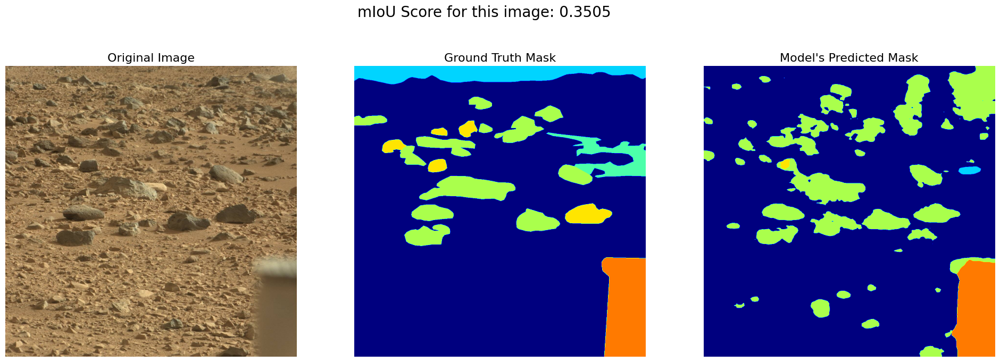

In [3]:
# Run this in a new cell

# --- Define Paths ---
VAL_IMG_DIR = "/kaggle/input/s5marsdataset/S5Mars_data/images/hard"
VAL_MASK_DIR = "/kaggle/input/s5marsdataset/S5Mars_data/labels/hard"

# --- Pick a Sample Image ---
val_image_names = sorted(os.listdir(VAL_IMG_DIR))
sample_image_name = val_image_names[15] # <-- Try changing this index (e.g., 5, 10, 25)

img_path = os.path.join(VAL_IMG_DIR, sample_image_name)
mask_path = os.path.join(VAL_MASK_DIR, sample_image_name.replace(".jpg", ".png"))

# --- Load Image and Ground Truth Mask ---
image = Image.open(img_path).convert("RGB")
ground_truth_mask = Image.open(mask_path)
ground_truth_np = np.array(ground_truth_mask)

# --- Perform Inference ---
with torch.no_grad():
    pixel_values = image_processor(images=image, return_tensors="pt").pixel_values.to(DEVICE)
    outputs = model(pixel_values=pixel_values)
    logits = outputs.logits
    upsampled_logits = F.interpolate(logits, size=image.size[::-1], mode='bilinear', align_corners=False)
    predicted_mask_np = upsampled_logits.argmax(dim=1).cpu().numpy().squeeze()

# --- Calculate mIoU for this single image ---
miou_score = compute_miou(predicted_mask_np, ground_truth_np, NUM_CLASSES)

# --- Visualize the Results ---
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(24, 8))
fig.suptitle(f'mIoU Score for this image: {miou_score:.4f}', fontsize=20)

ax1.imshow(image)
ax1.set_title("Original Image", fontsize=16)
ax1.axis('off')

ax2.imshow(ground_truth_mask, cmap='jet', vmin=0, vmax=NUM_CLASSES-1)
ax2.set_title("Ground Truth Mask", fontsize=16)
ax2.axis('off')

ax3.imshow(predicted_mask_np, cmap='jet', vmin=0, vmax=NUM_CLASSES-1)
ax3.set_title("Model's Predicted Mask", fontsize=16)
ax3.axis('off')

plt.show()

In [4]:
# Run this in a new cell
# This will take a few minutes to complete.

all_miou_scores = []

# Get the list of validation image names
val_image_names = sorted(os.listdir(VAL_IMG_DIR))

for img_name in tqdm(val_image_names, desc="Evaluating on Validation Set"):
    img_path = os.path.join(VAL_IMG_DIR, img_name)
    mask_path = os.path.join(VAL_MASK_DIR, img_name.replace(".jpg", ".png"))

    image = Image.open(img_path).convert("RGB")
    ground_truth_mask = Image.open(mask_path)
    ground_truth_np = np.array(ground_truth_mask)
    
    with torch.no_grad():
        pixel_values = image_processor(images=image, return_tensors="pt").pixel_values.to(DEVICE)
        outputs = model(pixel_values=pixel_values)
        logits = outputs.logits
        upsampled_logits = F.interpolate(logits, size=image.size[::-1], mode='bilinear', align_corners=False)
        predicted_mask_np = upsampled_logits.argmax(dim=1).cpu().numpy().squeeze()
        
    miou = compute_miou(predicted_mask_np, ground_truth_np, NUM_CLASSES)
    all_miou_scores.append(miou)

# Calculate and print the final average mIoU score
final_miou = np.nanmean(all_miou_scores)

print("\n" + "="*50)
print(f"🎉 Evaluation Complete!")
print(f"Average mIoU over the entire validation set: {final_miou:.4f}")
print("="*50)

Evaluating on Validation Set: 100%|██████████| 3000/3000 [06:18<00:00,  7.92it/s]


🎉 Evaluation Complete!
Average mIoU over the entire validation set: 0.3725


In [5]:
# Run this in a new cell
def compute_pixel_accuracy(pred, label, ignore_index=255):
    """
    Calculates pixel accuracy.
    """
    pred, label = pred.flatten(), label.flatten()
    
    # Ignore pixels from the label that have the ignore_index value
    mask = label != ignore_index
    pred, label = pred[mask], label[mask]
    
    # If no valid pixels are left, return 0.
    if label.shape[0] == 0:
        return 0.0

    # Calculate the number of correct predictions
    correct = (pred == label).sum().item()
    # Calculate the total number of pixels to consider
    total = label.shape[0]
    
    # Return the accuracy
    return correct / total

In [6]:
# Run this in a new cell
# This is your previous code, now updated to calculate accuracy as well.

# --- Initialize lists to store scores for each image ---
all_miou_scores = []
all_accuracy_scores = [] # <-- NEW

# Get the list of validation image names
val_image_names = sorted(os.listdir(VAL_IMG_DIR))

for img_name in tqdm(val_image_names, desc="Evaluating on Validation Set"):
    img_path = os.path.join(VAL_IMG_DIR, img_name)
    mask_path = os.path.join(VAL_MASK_DIR, img_name.replace(".jpg", ".png"))

    image = Image.open(img_path).convert("RGB")
    ground_truth_mask = Image.open(mask_path)
    ground_truth_np = np.array(ground_truth_mask)
    
    with torch.no_grad():
        pixel_values = image_processor(images=image, return_tensors="pt").pixel_values.to(DEVICE)
        outputs = model(pixel_values=pixel_values)
        logits = outputs.logits
        upsampled_logits = F.interpolate(logits, size=image.size[::-1], mode='bilinear', align_corners=False)
        predicted_mask_np = upsampled_logits.argmax(dim=1).cpu().numpy().squeeze()
        
    # Calculate mIoU for the current image
    miou = compute_miou(predicted_mask_np, ground_truth_np, NUM_CLASSES)
    all_miou_scores.append(miou)
    
    # Calculate Pixel Accuracy for the current image # <-- NEW
    accuracy = compute_pixel_accuracy(predicted_mask_np, ground_truth_np) # <-- NEW
    all_accuracy_scores.append(accuracy) # <-- NEW

# --- Calculate and print the final average scores ---
final_miou = np.nanmean(all_miou_scores)
final_accuracy = np.mean(all_accuracy_scores) # <-- NEW

print("\n" + "="*50)
print(f"🎉 Evaluation Complete!")
print(f"Average mIoU over the validation set:           {final_miou:.4f}")
print(f"Average Pixel Accuracy over the validation set: {final_accuracy:.4f}") # <-- NEW
print("="*50)

Evaluating on Validation Set: 100%|██████████| 3000/3000 [06:12<00:00,  8.06it/s]


🎉 Evaluation Complete!
Average mIoU over the validation set:           0.3725
Average Pixel Accuracy over the validation set: 0.7586


In [1]:
# Run this in a new cell
import torch
import torch.nn.functional as F
from PIL import Image
import matplotlib.pyplot as plt
import os
import numpy as np

def test_and_visualize(model, image_processor, device, image_path, mask_path):
    """
    Loads a single image, runs inference, and visualizes the original image,
    the ground truth mask, and the model's predicted mask.
    """
    print(f"--- Testing image: {os.path.basename(image_path)} ---")
    
    # 1. Load the image and ground truth mask
    image = Image.open(image_path).convert("RGB")
    ground_truth_mask = Image.open(mask_path)

    # 2. Set model to evaluation mode and perform inference
    model.eval()
    with torch.no_grad():
        # Prepare image for model
        pixel_values = image_processor(images=image, return_tensors="pt").pixel_values.to(device)
        
        # Get model output (logits)
        outputs = model(pixel_values=pixel_values)
        logits = outputs.logits
        
        # Upsample logits to the original image's size
        upsampled_logits = F.interpolate(
            logits,
            size=image.size[::-1], # (height, width)
            mode='bilinear',
            align_corners=False
        )
        
        # Get the final predicted class for each pixel
        predicted_mask = upsampled_logits.argmax(dim=1).cpu().numpy().squeeze()

    # 3. Visualize the results
    fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(24, 8))
    
    ax1.imshow(image)
    ax1.set_title("Original Image", fontsize=16)
    ax1.axis('off')

    ax2.imshow(ground_truth_mask, cmap='jet', vmin=0, vmax=NUM_CLASSES-1)
    ax2.set_title("Ground Truth Mask", fontsize=16)
    ax2.axis('off')

    ax3.imshow(predicted_mask, cmap='jet', vmin=0, vmax=NUM_CLASSES-1)
    ax3.set_title("Model's Predicted Mask", fontsize=16)
    ax3.axis('off')

    plt.tight_layout()
    plt.show()

print("Visualization function is ready.")

Visualization function is ready.


--- Testing image: 0003ML0000000160100036E01_DXXX.jpg ---


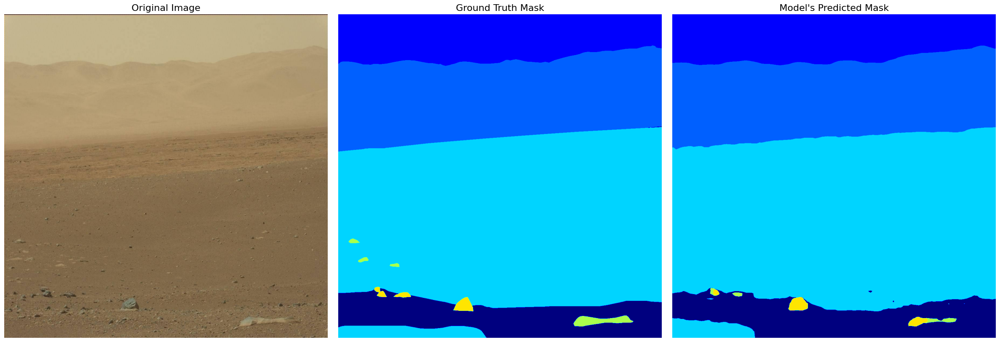

--- Testing image: 0003ML0000000260100046E01_DXXX.jpg ---


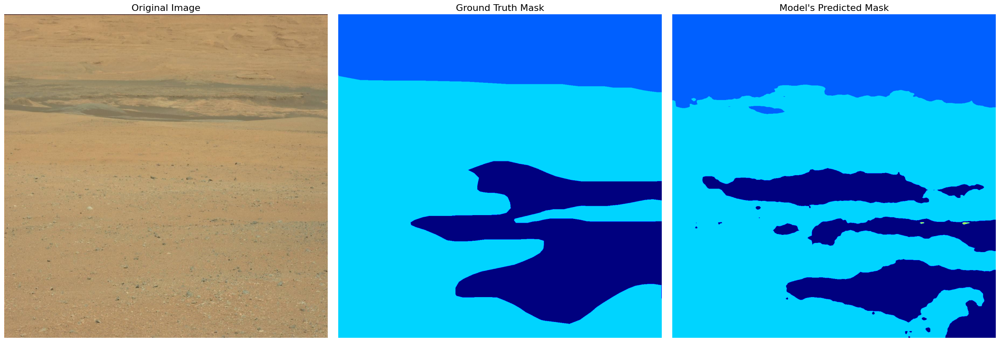

--- Testing image: 0003ML0000000390100059E01_DXXX.jpg ---


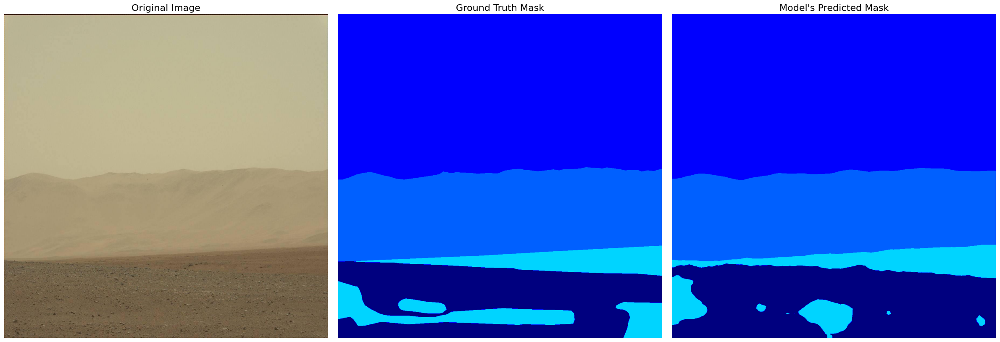

--- Testing image: 0003ML0000001130100133E01_DXXX.jpg ---


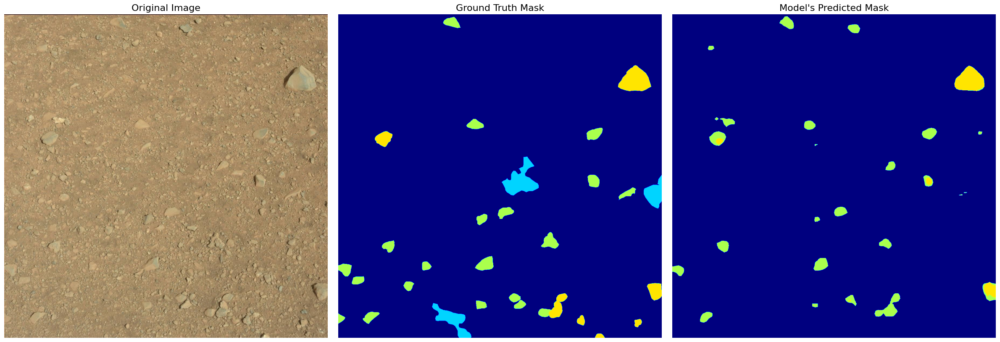

--- Testing image: 0003ML0000001180100138E01_DXXX.jpg ---


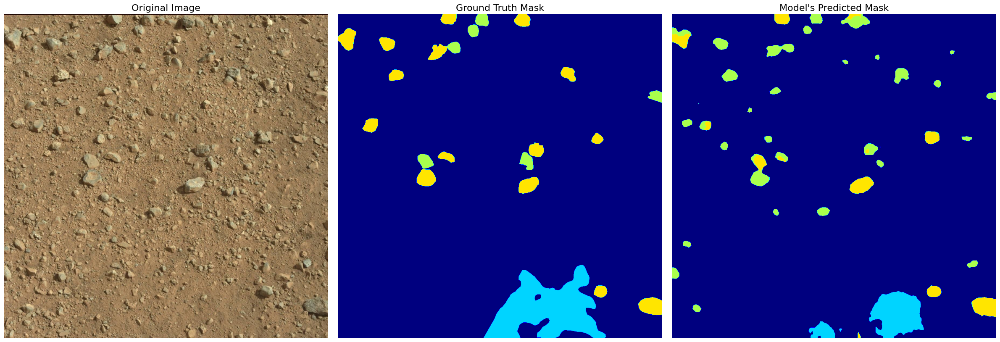

--- Testing image: 0013ML0000150010100184E01_DXXX.jpg ---


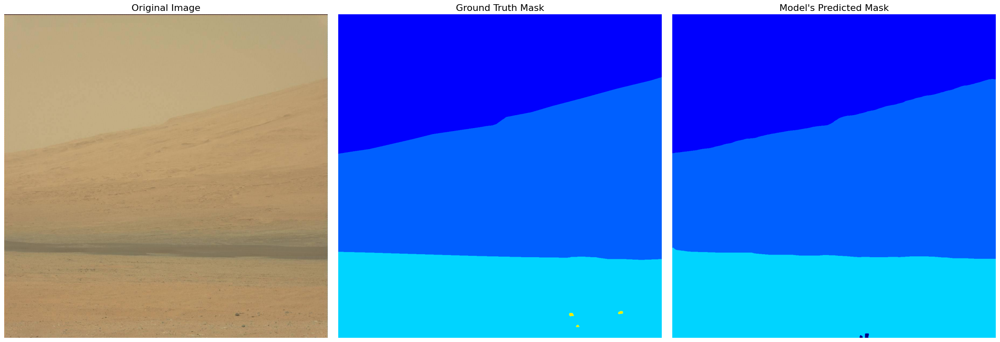

--- Testing image: 0013ML0000150060100189E01_DXXX.jpg ---


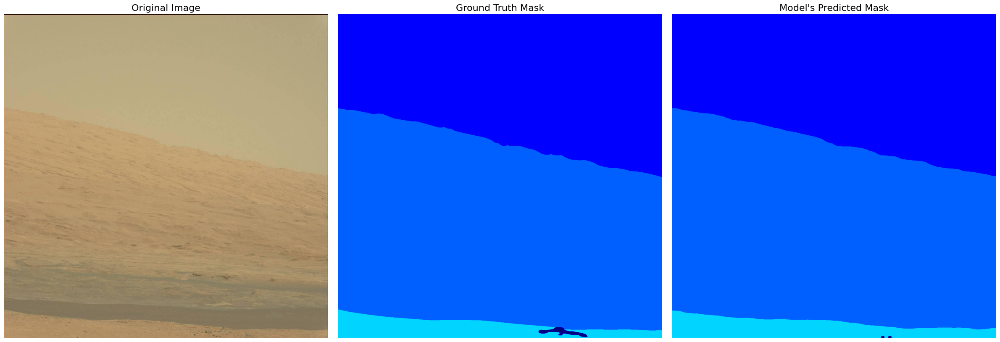

In [4]:
# Run this in a new cell

# --- Define Paths to your validation data ---
VAL_IMG_DIR = "/kaggle/input/s5marsdataset/S5Mars_data/images/easy"
VAL_MASK_DIR = "/kaggle/input/s5marsdataset/S5Mars_data/labels/easy"

# Get a list of all available images
val_image_names = sorted(os.listdir(VAL_IMG_DIR))

# --- CHOOSE WHICH IMAGES TO TEST ---
# You can change the numbers in this list to see different results.
# For example: [0, 10, 20, 30]
indices_to_test = [5, 15, 28,35,40,45,50] 

for idx in indices_to_test:
    if idx < len(val_image_names):
        sample_image_name = val_image_names[idx]
        
        # Construct the full file paths
        image_path = os.path.join(VAL_IMG_DIR, sample_image_name)
        mask_path = os.path.join(VAL_MASK_DIR, sample_image_name.replace(".jpg", ".png"))
        
        # Call the visualization function
        test_and_visualize(model, image_processor, DEVICE, image_path, mask_path)
    else:
        print(f"Index {idx} is out of range. There are only {len(val_image_names)} images.")

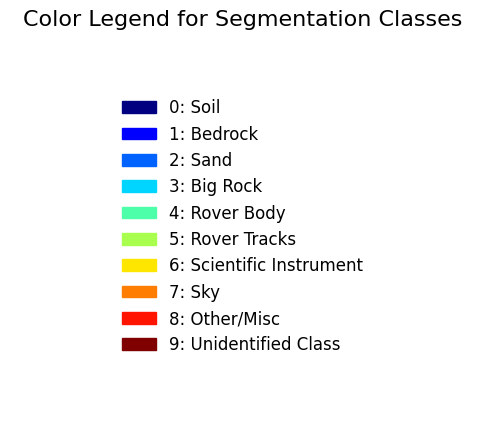

In [5]:
# Run this in a new cell

import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import numpy as np

# --- IMPORTANT: EDIT THIS LIST ---
# Replace these placeholder names with the actual names of your 10 classes in order (0-9).
# I have put in some likely candidates for a Mars dataset as an example.
class_names = [
    "0: Soil",
    "1: Bedrock",
    "2: Sand",
    "3: Big Rock",
    "4: Rover Body",        # Placeholder
    "5: Rover Tracks",      # Placeholder
    "6: Scientific Instrument", # Placeholder
    "7: Sky",               # Placeholder
    "8: Other/Misc",        # Placeholder
    "9: Unidentified Class" # Placeholder
]

# Get the 'jet' colormap, which is commonly used for segmentation masks
# We will pull 10 distinct colors from it.
num_classes = len(class_names)
cmap = plt.get_cmap('jet', num_classes)

# --- Create the Plot ---
fig, ax = plt.subplots(figsize=(6, 5), dpi=100)
ax.set_title("Color Legend for Segmentation Classes", fontsize=16)

# Create a list of patches and labels
patches = []
for i in range(num_classes):
    color = cmap(i)
    patch = mpatches.Patch(color=color, label=class_names[i])
    patches.append(patch)

# Create the legend from the patches
ax.legend(handles=patches, loc='center', frameon=False, fontsize=12)

# Hide the axes
ax.axis('off')

plt.show()

In [6]:
# Run this in a new cell
import torch
import torch.nn.functional as F
from PIL import Image
import matplotlib.pyplot as plt
import os
import numpy as np

# Re-using the class names from our legend for consistency
# --- IMPORTANT: ENSURE THIS LIST MATCHES YOUR ACTUAL CLASS NAMES ---
class_names = [
    "0: Soil",
    "1: Bedrock",
    "2: Sand",
    "3: Big Rock",
    "4: Rover Body",
    "5: Rover Tracks",
    "6: Scientific Instrument",
    "7: Sky",
    "8: Other/Misc",
    "9: Unidentified Class"
]
NUM_CLASSES = len(class_names) # Ensure this matches your model's num_labels

def visualize_class_masks(model, image_processor, device, image_path, mask_path, highlight_class_ids=None, alpha=0.6):
    """
    Loads an image, performs inference, and visualizes the original image,
    ground truth, and predicted mask. Allows highlighting specific classes
    with distinct colors overlaid on the original image.
    
    Args:
        model: Your trained Segformer model.
        image_processor: The SegformerImageProcessor.
        device: 'cuda' or 'cpu'.
        image_path (str): Path to the input image.
        mask_path (str): Path to the ground truth mask.
        highlight_class_ids (list, optional): A list of class IDs (integers)
            to highlight. If None, it will show the full predicted mask.
        alpha (float): Transparency level for overlaid masks (0.0 to 1.0).
    """
    print(f"--- Visualizing image: {os.path.basename(image_path)} ---")
    
    # 1. Load the image and ground truth mask
    original_image_pil = Image.open(image_path).convert("RGB")
    ground_truth_mask_pil = Image.open(mask_path)
    
    # 2. Set model to evaluation mode and perform inference
    model.eval()
    with torch.no_grad():
        pixel_values = image_processor(images=original_image_pil, return_tensors="pt").pixel_values.to(device)
        outputs = model(pixel_values=pixel_values)
        logits = outputs.logits
        upsampled_logits = F.interpolate(
            logits,
            size=original_image_pil.size[::-1],
            mode='bilinear',
            align_corners=False
        )
        predicted_mask_np = upsampled_logits.argmax(dim=1).cpu().numpy().squeeze()

    # Get the 'jet' colormap for consistent coloring
    cmap = plt.get_cmap('jet', NUM_CLASSES)

    # Prepare figures
    if highlight_class_ids:
        fig, axes = plt.subplots(1, 2 + len(highlight_class_ids), figsize=(8 + 6 * len(highlight_class_ids), 6))
    else:
        fig, axes = plt.subplots(1, 3, figsize=(24, 6))

    # --- Plot 1: Original Image ---
    axes[0].imshow(original_image_pil)
    axes[0].set_title("Original Image", fontsize=14)
    axes[0].axis('off')

    # --- Plot 2: Ground Truth Mask ---
    axes[1].imshow(ground_truth_mask_pil, cmap=cmap, vmin=0, vmax=NUM_CLASSES - 1)
    axes[1].set_title("Ground Truth Mask", fontsize=14)
    axes[1].axis('off')

    # --- Plot 3 (or more): Predicted Mask / Highlighted Classes ---
    if highlight_class_ids:
        for i, class_id in enumerate(highlight_class_ids):
            if class_id < 0 or class_id >= NUM_CLASSES:
                print(f"Warning: Class ID {class_id} is out of valid range (0-{NUM_CLASSES-1}). Skipping.")
                continue

            # Create an empty mask with 4 channels (RGBA)
            highlighted_mask = np.zeros((*predicted_mask_np.shape, 4), dtype=np.uint8)
            
            # Get the color for this class from the colormap
            class_color_rgba = cmap(class_id) # Returns RGBA (0.0-1.0)
            
            # Find where the model predicted this class
            class_pixels = (predicted_mask_np == class_id)
            
            # Apply the color to the relevant pixels
            highlighted_mask[class_pixels, 0] = int(class_color_rgba[0] * 255) # R
            highlighted_mask[class_pixels, 1] = int(class_color_rgba[1] * 255) # G
            highlighted_mask[class_pixels, 2] = int(class_color_rgba[2] * 255) # B
            highlighted_mask[class_pixels, 3] = int(alpha * 255) # A (transparency)

            # Overlay on original image
            # Convert original_image_pil to numpy array for blending
            original_image_np = np.array(original_image_pil)
            blended_image = original_image_np.copy()
            
            # Blend using alpha compositing: new_pixel = alpha * overlay_pixel + (1-alpha) * base_pixel
            # Only apply where class_pixels is True (where the mask exists)
            alpha_mask = highlighted_mask[class_pixels, 3] / 255.0 # Use per-pixel alpha
            
            for c in range(3): # For R, G, B channels
                blended_image[class_pixels, c] = (alpha_mask * highlighted_mask[class_pixels, c] + \
                                                  (1 - alpha_mask) * original_image_np[class_pixels, c]).astype(np.uint8)

            axes[i + 2].imshow(blended_image)
            axes[i + 2].set_title(f"Predicted: {class_names[class_id]}", fontsize=14)
            axes[i + 2].axis('off')
    else:
        # Default: show the full predicted mask if no specific classes are highlighted
        axes[2].imshow(predicted_mask_np, cmap=cmap, vmin=0, vmax=NUM_CLASSES - 1)
        axes[2].set_title("Model's Full Predicted Mask", fontsize=14)
        axes[2].axis('off')

    plt.tight_layout()
    plt.show()

print("Enhanced visualization function `visualize_class_masks` is ready.")

Enhanced visualization function `visualize_class_masks` is ready.



--- Example 1: Highlighting specific classes (e.g., Soil and Big Rock) ---
--- Visualizing image: 0003ML0000000360100056E01_DXXX.jpg ---


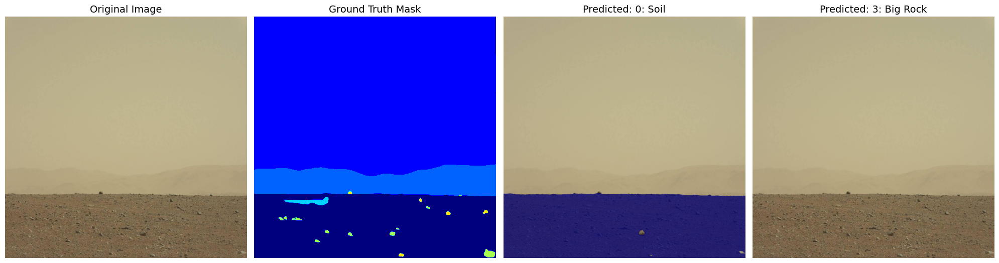


--- Example 2: Highlighting different classes (e.g., Sand and Rover Tracks) ---
--- Visualizing image: 0003ML0000000290100049E02_DXXX.jpg ---


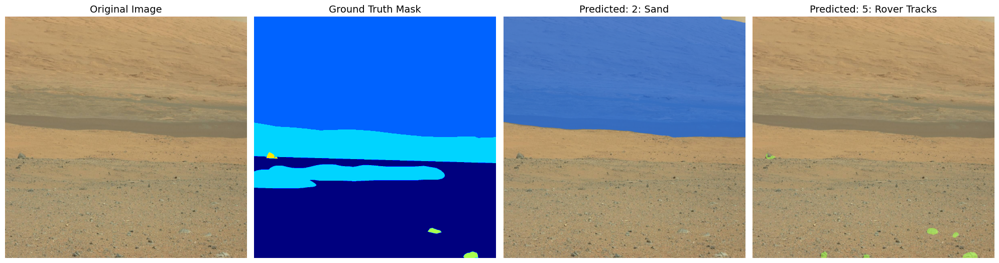


--- Example 3: Showing the full predicted mask (no specific highlight) ---
--- Visualizing image: 0003ML0000000180100038E01_DXXX.jpg ---


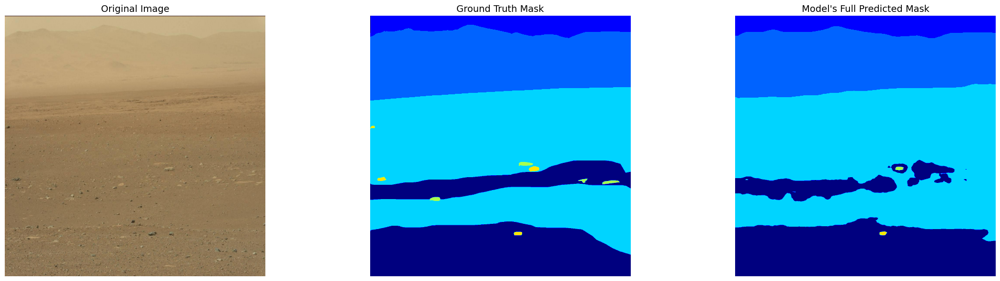

In [7]:
# Run this in a new cell

# --- Define Paths to your validation data ---
VAL_IMG_DIR = "/kaggle/input/s5marsdataset/S5Mars_data/images/easy"
VAL_MASK_DIR = "/kaggle/input/s5marsdataset/S5Mars_data/labels/easy"

# Get a list of all available images
val_image_names = sorted(os.listdir(VAL_IMG_DIR))

# --- IMPORTANT: ENSURE YOUR 'model', 'image_processor', and 'DEVICE' are loaded from Cell 1 ---

# --- EXAMPLE 1: Highlight specific classes on an image ---
print("\n--- Example 1: Highlighting specific classes (e.g., Soil and Big Rock) ---")
idx_to_test_1 = 25 # Change this index to see a different image
if idx_to_test_1 < len(val_image_names):
    sample_image_name_1 = val_image_names[idx_to_test_1]
    image_path_1 = os.path.join(VAL_IMG_DIR, sample_image_name_1)
    mask_path_1 = os.path.join(VAL_MASK_DIR, sample_image_name_1.replace(".jpg", ".png"))
    
    # Try to highlight Soil (class 0) and Big Rock (class 3)
    visualize_class_masks(model, image_processor, DEVICE, image_path_1, mask_path_1, 
                          highlight_class_ids=[0, 3], alpha=0.7)
else:
    print(f"Index {idx_to_test_1} is out of range.")

# --- EXAMPLE 2: Highlight a different set of classes on another image ---
print("\n--- Example 2: Highlighting different classes (e.g., Sand and Rover Tracks) ---")
idx_to_test_2 = 18 # Change this index
if idx_to_test_2 < len(val_image_names):
    sample_image_name_2 = val_image_names[idx_to_test_2]
    image_path_2 = os.path.join(VAL_IMG_DIR, sample_image_name_2)
    mask_path_2 = os.path.join(VAL_MASK_DIR, sample_image_name_2.replace(".jpg", ".png"))
    
    # Try to highlight Sand (class 2) and Rover Tracks (class 5)
    visualize_class_masks(model, image_processor, DEVICE, image_path_2, mask_path_2, 
                          highlight_class_ids=[2, 5], alpha=0.6)
else:
    print(f"Index {idx_to_test_2} is out of range.")

# --- EXAMPLE 3: Show the full predicted mask (similar to previous code) ---
print("\n--- Example 3: Showing the full predicted mask (no specific highlight) ---")
idx_to_test_3 = 7 # Change this index
if idx_to_test_3 < len(val_image_names):
    sample_image_name_3 = val_image_names[idx_to_test_3]
    image_path_3 = os.path.join(VAL_IMG_DIR, sample_image_name_3)
    mask_path_3 = os.path.join(VAL_MASK_DIR, sample_image_name_3.replace(".jpg", ".png"))
    
    # Passing None for highlight_class_ids shows the full mask
    visualize_class_masks(model, image_processor, DEVICE, image_path_3, mask_path_3, 
                          highlight_class_ids=None)
else:
    print(f"Index {idx_to_test_3} is out of range.")

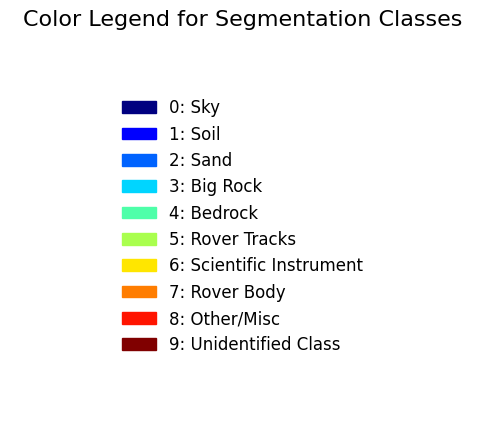

In [8]:
# Re-run this cell with the CORRECTED class_names list

import matplotlib.pyplot as plt
import matplotlib.patches as mpatches

# --- CORRECTED LIST (EXAMPLE) ---
# You need to confirm the other classes by investigating the data.
class_names = [
    "0: Sky",               # Deduced from its blue color
    "1: Soil",              # This is now just a guess, needs verification
    "2: Sand",              # This is now just a guess, needs verification
    "3: Big Rock",          # This is now just a guess, needs verification
    "4: Bedrock",           # Re-ordered, needs verification
    "5: Rover Tracks",
    "6: Scientific Instrument",
    "7: Rover Body",        # Re-ordered, needs verification
    "8: Other/Misc",
    "9: Unidentified Class"
]

num_classes = len(class_names)
cmap = plt.get_cmap('jet', num_classes)

fig, ax = plt.subplots(figsize=(6, 5), dpi=100)
ax.set_title("Color Legend for Segmentation Classes", fontsize=16)

patches = []
for i in range(num_classes):
    color = cmap(i)
    patch = mpatches.Patch(color=color, label=class_names[i])
    patches.append(patch)

ax.legend(handles=patches, loc='center', frameon=False, fontsize=12)
ax.axis('off')
plt.show()

In [9]:
# Run this in a new cell
# This final version calculates averages AND shows the best/worst performing images.

import pandas as pd # <-- Import the pandas library

# --- Initialize lists to store scores for each image ---
all_miou_scores = []
all_accuracy_scores = []

# Get the list of validation image names
val_image_names = sorted(os.listdir(VAL_IMG_DIR))

for img_name in tqdm(val_image_names, desc="Evaluating on Validation Set"):
    img_path = os.path.join(VAL_IMG_DIR, img_name)
    mask_path = os.path.join(VAL_MASK_DIR, img_name.replace(".jpg", ".png"))

    image = Image.open(img_path).convert("RGB")
    ground_truth_mask = Image.open(mask_path)
    ground_truth_np = np.array(ground_truth_mask)
    
    with torch.no_grad():
        pixel_values = image_processor(images=image, return_tensors="pt").pixel_values.to(DEVICE)
        outputs = model(pixel_values=pixel_values)
        logits = outputs.logits
        upsampled_logits = F.interpolate(logits, size=image.size[::-1], mode='bilinear', align_corners=False)
        predicted_mask_np = upsampled_logits.argmax(dim=1).cpu().numpy().squeeze()
        
    miou = compute_miou(predicted_mask_np, ground_truth_np, NUM_CLASSES)
    all_miou_scores.append(miou)
    
    accuracy = compute_pixel_accuracy(predicted_mask_np, ground_truth_np)
    all_accuracy_scores.append(accuracy)

# --- NEW: Process and Display Detailed Results ---

# 1. Create a Pandas DataFrame to hold all the results
results_df = pd.DataFrame({
    'image_name': val_image_names,
    'miou': all_miou_scores,
    'accuracy': all_accuracy_scores
})

# 2. Sort the DataFrame by mIoU score in descending order (best to worst)
results_df_sorted = results_df.sort_values(by='miou', ascending=False)


# --- Display the Final Report ---

print("\n" + "="*50)
print(f"🎉 Evaluation Complete!")
print("--- Overall Average Scores ---")
print(f"Average mIoU:           {results_df['miou'].mean():.4f}")
print(f"Average Pixel Accuracy: {results_df['accuracy'].mean():.4f}")
print("="*50)

# Display the Top 5 best performing images
print("\n--- Top 5 Performing Images (by mIoU) ---")
print(results_df_sorted.head(5).to_string())

# Display the Bottom 5 worst performing images
print("\n--- Bottom 5 Performing Images (by mIoU) ---")
print(results_df_sorted.tail(5).to_string())
print("\n" + "="*50)

# To see ALL scores for every image, you can uncomment the line below
# print("\n--- All Image Scores ---")
# print(results_df_sorted.to_string())

Evaluating on Validation Set: 100%|██████████| 3000/3000 [08:02<00:00,  6.22it/s]


🎉 Evaluation Complete!
--- Overall Average Scores ---
Average mIoU:           0.6303
Average Pixel Accuracy: 0.9479

--- Top 5 Performing Images (by mIoU) ---
                              image_name  miou  accuracy
2015  0377MR0015510080301804E01_DXXX.jpg   1.0       1.0
799   0271MR0011930390203423E01_DXXX.jpg   1.0       1.0
800   0271MR0011930400203424E01_DXXX.jpg   1.0       1.0
801   0271MR0011930410203425E01_DXXX.jpg   1.0       1.0
788   0271MR0011930280203412E01_DXXX.jpg   1.0       1.0

--- Bottom 5 Performing Images (by mIoU) ---
                              image_name      miou  accuracy
698   0229ML0010730010106077E01_DXXX.jpg  0.296614  0.949232
86    0025MR0001200120100733E01_DXXX.jpg  0.292173  0.954897
198   0038MR0001710010101196E01_DXXX.jpg  0.278223  0.972523
1964  0375ML0015410420200062E02_DXXX.jpg  0.277877  0.953558
999   0311MR0012790410204135E01_DXXX.jpg  0.270757  0.919798

